In [10]:
import pandas as pd
import os
import sys
import glob

In [20]:
csv_dir = r'E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\all'
csv_file = r'2020-10-12-social-distancing.csv.gz'
# csv_file = r'2020-10-12-social-distancing.csv'

In [30]:
# df = pd.read_csv(os.path.join(csv_dir, csv_file), compression='gzip', header=1, sep=' ', quotechar='"', error_bad_lines=False)

df = pd.read_csv(os.path.join(csv_dir, csv_file))

In [49]:
df.head()

,origin_census_block_group,date_range_start,date_range_end,device_count,distance_traveled_from_home,bucketed_distance_traveled,median_dwell_at_bucketed_distance_traveled,completely_home_device_count,median_home_dwell_time,bucketed_home_dwell_time,...,destination_cbgs,delivery_behavior_devices,median_non_home_dwell_time,candidate_device_count,bucketed_away_from_home_time,median_percentage_time_home,bucketed_percentage_time_home,mean_home_dwell_time,mean_non_home_dwell_time,mean_distance_traveled_from_home
0,10139533002,2020-10-12T00:00:00-05:00,2020-10-13T00:00:00-05:00,71,6211,"{""16001-50000"":9,""0"":12,"">50000"":18,""2001-8000...","{""16001-50000"":118,"">50000"":51,""<1000"":243,""20...",10,706,"{""721-1080"":12,""361-720"":16,""61-360"":12,""<60"":...",...,"{""011010054033"":1,""011010027002"":1,""0103996240...",1,236,101,"{""21-45"":3,""481-540"":5,""541-600"":4,""46-60"":2,""...",73,"{""0-25"":8,""76-100"":32,""51-75"":20,""26-50"":10}",717,322,17182
1,10210601014,2020-10-12T00:00:00-05:00,2020-10-13T00:00:00-05:00,182,1706,"{""16001-50000"":26,""0"":40,"">50000"":20,""2001-800...","{""16001-50000"":38,"">50000"":67,""<1000"":74,""2001...",41,822,"{""721-1080"":38,""361-720"":24,""61-360"":24,""<60"":...",...,"{""011010053021"":1,""011170303191"":6,""0102106010...",2,189,270,"{""21-45"":7,""481-540"":10,""541-600"":6,""46-60"":3,...",76,"{""0-25"":40,""76-100"":92,""51-75"":36,""26-50"":14}",742,337,8497
2,10950303005,2020-10-12T00:00:00-05:00,2020-10-13T00:00:00-05:00,85,3282,"{""16001-50000"":7,""0"":17,"">50000"":14,""2001-8000...","{""16001-50000"":23,"">50000"":36,""<1000"":23,""2001...",21,761,"{""721-1080"":14,""361-720"":13,""61-360"":1,""<60"":1...",...,"{""121270909041"":1,""011030051012"":1,""0109503030...",7,122,153,"{""21-45"":6,""481-540"":2,""541-600"":5,""721-840"":3...",81,"{""0-25"":17,""76-100"":44,""51-75"":15,""26-50"":6}",721,344,14730
3,11010055032,2020-10-12T00:00:00-05:00,2020-10-13T00:00:00-05:00,108,3500,"{""16001-50000"":15,""0"":25,"">50000"":8,""2001-8000...","{""16001-50000"":170,"">50000"":21,""<1000"":365,""20...",25,837,"{""721-1080"":27,""361-720"":13,""61-360"":13,""<60"":...",...,"{""011091891002"":1,""011010027002"":2,""0110100560...",7,123,160,"{""21-45"":9,""481-540"":2,""541-600"":5,""46-60"":1,""...",83,"{""0-25"":14,""76-100"":61,""51-75"":16,""26-50"":3}",763,282,6125
4,40210002061,2020-10-12T00:00:00-07:00,2020-10-13T00:00:00-07:00,541,1883,"{""16001-50000"":102,""0"":169,"">50000"":48,""2001-8...","{""16001-50000"":63,"">50000"":62,""<1000"":84,""2001...",171,778,"{""721-1080"":108,""361-720"":74,""61-360"":59,""<60""...",...,"{""040210002041"":26,""040132168531"":1,""040133194...",10,63,969,"{""21-45"":32,""481-540"":22,""541-600"":21,""46-60"":...",90,"{""0-25"":105,""76-100"":315,""51-75"":90,""26-50"":27}",723,236,12293


In [190]:
[print(x) for x in df.columns.to_list()]

origin_census_block_group
date_range_start
date_range_end
device_count
distance_traveled_from_home
bucketed_distance_traveled
median_dwell_at_bucketed_distance_traveled
completely_home_device_count
median_home_dwell_time
bucketed_home_dwell_time
at_home_by_each_hour
part_time_work_behavior_devices
full_time_work_behavior_devices
destination_cbgs
delivery_behavior_devices
median_non_home_dwell_time
candidate_device_count
bucketed_away_from_home_time
median_percentage_time_home
bucketed_percentage_time_home
mean_home_dwell_time
mean_non_home_dwell_time
mean_distance_traveled_from_home


[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

In [43]:
for idx, row in df.iterrows():
    
    interval_num = 10000
    state_id = str(row["origin_census_block_group"])[:2]
    if state_id == "48":
        print(row["origin_census_block_group"])
#     if idx % interval_num == 0:
#         print(row["origin_census_block_group"])

480139606002
480270201003
480291620042
480590301023
480639501022
480679505003
481410013022
481410103113
481410104013
482013107002
482013144001
482013219003
482030203021
482150204033
482917007002
482979504002
483610223002
484090103012
484391002023
484790002004
484850135013
480190001021
480291105001
480291619011
480291806045
480610138021
480970007002
481130067004
481210216273
481210216351
481350017001
481872107123
482090108092
482319607004
482511304071
482770010003
482939701002
483030104043
483290101095
483396920011
483750145005
484230019011
484391009001
484391115292
484930005002
480270216011
480291211083
480291906041
480850305113
480913101004
481130091042
481410001082
482015543022
482339505002
482659605002
483396926021
483499702004
484199506003
484230019083
484391219053
484510008021
484530017543
480190001022
480239503003
480291211173
480291219101
480610124013
480679504004
480850313156
481130065021
481130108051
481130122042
481130150005
481199502001
481210202051
481210204032
481339502006

483396923003
483550058023
483630005002
484391115422
484771704001
484790017162
480990105021
481130196002
481410043122
482150212014
482570513002
483030007001
483396916012
483479505021
483750148003
484090112002
484391014032
484391050085
484391131041
484530017601
484530018585
480079504001
480239503002
480610121021
480850320121
481130002023
481130038001
481130108042
481130194001
481350025012
481390602041
481576732002
482090104002
482150203024
482150244041
483550036031
483750101001
483810216021
484391115243
484391136104
484850132004
480291206005
480291417002
480291817134
481119503002
481130170034
481899502002
482012322004
482015429003
482999705003
483030017082
483379505004
483550027044
483810216063
484530022111
480139606003
480291308001
480291511007
480370111001
480396605002
480396615012
480850316382
481130079024
481130096091
481130122113
481130130091
481130181271
481130207002
481210214094
481677217003
482015529005
482150221032
482339509002
483090025012
483396931011
483750122002
483810216024

480090201002
481130105002
481130154012
481410103262
482012201002
482013237012
482399501002
482450113041
482979503001
483610224002
484391112042
484391138111
484510016003
484790017132
480090203002
480270204021
480291817151
481019501003
481130054002
481130192082
481210217272
481810004001
481810009022
481872103001
481990303001
482012538004
482012542001
482013132002
482013312001
482013417003
482150218031
482150241052
482150241072
482319608003
482559704001
483750107001
484391022023
484850113001
484959504001
480291920004
480396617001
480819502002
480850312013
481130017031
481130096041
481130110012
481130126041
481130181381
481210217291
481410040041
481576739022
481677219001
481830007005
481990310002
482015419002
483879505002
484279501051
484391113082
484391140082
480970001002
480990106042
481130130072
481350025023
481410104082
481576726011
481639502001
482014312022
482014328024
483030022041
483159502001
483396939005
483550014003
484019505012
484391139064
484530017703
484619502001
480519702001

480291707003
480291719022
480291719143
480291805033
480291815041
480410013033
480610132072
481130137163
481130165211
481576724002
482013109004
482013202001
482030203012
482199502004
482239504021
482899502001
484391112025
484659503021
480270235003
480291808002
481130190311
482012503012
482015214004
482090108083
483030019013
483396902025
484391046011
484410114003
484530001013
484530018591
480270223004
480291816011
480291817042
480850310014
480850316214
480850318073
481130064023
481210215022
481350004003
481350029003
481390610003
481410102172
482012409022
482150209042
484090109001
484230021021
484391055024
484391136111
480850316471
481130021001
481130064022
481130136072
481130146031
481210201101
481210217312
481872107072
482012527003
482150220034
482279506003
482459800001
483550009001
483671405011
483750144011
484391141034
480270223002
480291505022
480370114021
480739508023
481130017033
481130137152
481210206021
481990308005
482012504023
482013136001
482014127002
482015319002
483396943012

482450105003
482450106003
483550054102
483750116002
484230021012
484391110162
484391115245
484910208092
480396644005
481350028022
481410011135
481576744001
481830007003
482012524003
482013417001
482015423021
482511303042
482999701001
483396920014
483610215021
484391023013
484530018112
484530018332
484850110001
480291520001
481130097021
481130108033
481130128002
481130164122
481130178121
481390612001
481677258003
482012531001
482014208001
482015555022
482150204043
482319616004
483030009004
483732103023
483810209001
484230020072
484391055073
484410104001
484530018061
484659506024
484679504002
480396605005
480590301022
480850313132
481130115004
481130136261
481130152044
482013206021
482013403012
482015421022
482150207013
482150221062
482239503002
483319503002
483479510001
483550010004
483799501001
484230018031
484391132151
484391138101
484690005012
484850109001
480279800011
480291313004
480291521002
480291910043
480396607013
480850308022
480850316535
481130063012
481130096111
481810012004

480291719032
480396614003
480679506001
481130034001
481130190321
481210213032
481872101002
482139509021
482450022002
483290001002
483479508002
484230018022
484230019071
484530017503
484530023163
484679507003
484817406003
480079505004
480291211161
480499509002
481130092022
481390604003
481677201003
482015342024
482090108071
482211602051
483396921001
483899504003
484019509003
484090108003
484279501052
484736803001
480291316091
480410007004
480610108001
480610119031
480850317141
481130116022
481210211001
481830007001
481990302003
482014223011
482015342031
482090103022
482150209041
482559703004
483030018014
483396931014
483610219002
484391045021
484410134021
484510013041
484910203211
484910204042
480219507003
480291702005
480291914052
480913109011
481130004043
481210217342
481610007001
482012506001
482013210005
482014325001
482014519014
482015516003
482150221031
483379506002
484230021013
484391220012
484817403001
484910201112
480291206007
480396623003
480839503004
480850316411
481130098024

481410102112
481576748001
481830101003
481990309001
482012504012
482015105001
483030021022
483090020002
483750130002
484391104023
484910208044
480291913042
480370108003
480850316562
481130126032
481350006003
481810011021
482012537004
482015302001
482770003003
483339501002
483379504001
483732105001
483970403011
480270210003
480270231061
480410003002
480850316383
480850316401
481210203072
481410103231
481899501002
482014502001
482014553001
482279504003
482450025002
484179503001
484230018014
484530018352
480291718013
481410002041
481830102005
482012330012
482012520001
482013101002
482015214001
482015321002
483290014001
483550021011
484391113043
484391114081
484391136103
484530019112
480291218091
481130181041
481259503002
481410043072
481599502001
481639501003
481990308006
482013413022
482014105004
482014301001
482015310001
483159504001
484019502002
484059501002
484391139122
484910215031
480291611002
480479502005
480610138022
481210216291
481390602132
481677209001
482013318001
482014130002

480291507002
480410001012
481130195013
482013117002
482014111002
482450106001
483090024981
483290006004
484391216101
484910205082
480270220002
480291915031
480639502005
481130078233
481130081003
481210213041
481410103341
482013302001
482015405011
482015417002
482139503005
482570506003
483090009003
483090015001
484391137071
484530017493
484817405002
480410010003
480739506003
480739508012
480990106013
481130071011
481130087042
481130134001
481130141133
481130141364
481210201052
481350024005
481410103124
482014118003
482015334002
482139502002
482139509033
482450106004
482979501004
483090037082
483396920016
484391141025
484391142072
484759501002
480090201001
480291818183
480291910042
481130039012
481130052002
481130082004
481130173033
481499706003
481576758001
482013428002
482014318013
482150231042
483396936002
483550023033
483671404053
483719503001
484391047022
484391107041
484391139241
480019507003
480291215014
480291807024
480570002002
480610125041
480610126131
481576722001
481719503004

480291519002
480291904002
480439503002
481130181361
481410023006
481576731011
482013101001
482014529001
482015504013
482450108001
482511304063
484391219062
484530008032
480291316081
480291402001
480291519001
480739503004
481130152043
481130207001
481390608012
481830102006
482013111003
482014335012
482015555021
482450109022
482511309001
483030105091
483290101121
484391132203
484910206022
480850317123
481130044003
481130166202
481350017007
481799505002
481872108031
482012104002
482014115023
482559701002
483810218011
484199501002
484391107014
484391109015
484410112003
480270232011
480370115022
481130063011
481130141283
481130165192
482014126003
482014513002
482015325023
482090107013
483290011001
483550035002
484391135172
484530019191
484530022023
484790018152
480291810033
480610116001
480619801001
480990108022
481130087012
481576702004
481677223006
481810003031
481979501003
482012337012
482013126002
482014326001
482770004012
483810211012
484019508002
484179503003
484391111042
484391131101

480270230002
480499510001
481130079062
481130162012
481210217322
481339505001
481677210001
482015320014
482150220042
482399503002
482850004002
483379503001
483610218001
483750126001
483810217031
484391065112
484391131091
484391139213
484530017472
484790009042
480396637002
480410017022
481410037023
481410041042
482012114002
482015107001
482279501003
482499501002
483090025011
483810203002
484230021023
484530021131
484910205072
480291214032
480291703002
480370105003
480610111002
481130166221
481130190213
481130196001
481576739021
482013402021
482015214002
482530205003
483030104072
483090007002
483959604002
484379503004
480291801021
480410006034
481130190041
482012319001
483030102002
483479506002
484391065143
484391223002
484530005002
484530018491
480019508001
480990106043
481210216251
481410024001
481830008003
482015536001
482015548022
482015554024
482150205034
482511304083
483090025041
483217302013
484391065171
484391139062
484910205043
480019509012
480050009012
480259505007
480291313003

480291607011
480897502001
481130190332
481390609002
481390609003
481576752001
481677256004
482012119003
482013108002
482014311022
482015110011
482079503002
482339508001
482659604023
483810213004
484391021005
484530017652
484530024131
484790017093
484817410001
480190004002
480717102005
481130113002
481130164061
481677233003
481810007001
481830103021
482014214033
482319615031
482511303021
484199502002
484690016011
480291719021
480291914055
480291920002
480410020151
480850302034
480850305282
481130088026
481130177033
481130190142
481410011043
482150226001
482150245001
482319601002
482659607003
483396928021
483970403012
484391141023
484690016053
484910204101
480291215062
480291405002
480291603002
480913102003
481130131053
481130144082
481410011153
483090017001
483396909001
483899503001
484230020042
484391014021
484391020001
484391062014
480291711001
480410001014
481130165183
481410017001
481410031004
481830009001
482150202041
482150225022
482770002002
483090017003
483090038022
483250004011

480050009011
480219506003
481130143061
481210217232
482014504003
482015410031
482090109093
482450055001
484530017143
480610103024
480610133081
480610144001
481130191004
482012111002
482013136003
482014501001
482139509022
483396919003
483550016014
483579503002
484019504003
484391004003
484391135183
484391140033
484530018432
484910203262
480050004002
480050013001
480291910033
480359501004
480396645015
481130069001
481810005011
482012230022
482013309003
482917014002
484199505002
484530017781
485079503012
480639501021
481130072025
481130098043
481130190333
482013412012
482014223012
482015323001
482150235121
483159503003
483550051022
484090103011
484530019081
484690001001
484910216012
480050010022
480291306004
480359504001
480610125062
480679506004
481130014001
481130136103
481130141214
481130192081
481599503002
481830005023
481872105051
482015534031
483239506021
483396943021
484230011023
484850117002
484850136006
480291515003
480396608012
480639502003
481130166203
481130192044
481576731012

480270215003
480291306003
481039501003
481130136252
481130181201
481130192122
481159505001
481210217433
481299502002
482014321001
482450109013
483030014005
483290101041
483319501002
483750153001
484019512001
484410101003
480291902004
480679507001
480850313102
480850316135
481410028005
482014212011
483250001021
484319501001
484391005021
484391054064
484391216041
484530003071
484930004042
480019511003
480291910062
480610141002
481130106022
481130181403
481959501001
482012546002
482013339023
482013427003
482014519021
482015102002
482150215003
482199505003
482450066002
483030016011
483610202001
484391042012
484391112023
484391136071
484530017482
484530018321
484717905003
484910209004
480090202003
480291914081
480396621001
480396639002
480499511003
480850305222
480850310032
481130144061
481830015003
482012516002
482015102001
482090109103
482150239042
482211602072
482399502001
482450011001
483090032003
483610224004
484391115463
484530021111
484530022021
484717904001
480291212041
480291713023

480050012001
480270211004
480270216021
480291314012
480410013022
481130082002
481410034042
481639503003
482012111003
482015224021
482015541022
482850006001
484391132212
484410102001
480396615022
480410018012
480850316213
481130164092
481130165093
481130184031
481210217471
481410002042
481410103451
482013124002
482150214012
482150218062
482319617002
483699502002
483750117003
483810220022
483879501001
484391115225
484510017043
484639501001
484910207061
480396645013
480459502001
481130081002
481130138051
481130166051
481130181053
481659501002
482013315004
482150227022
483030003022
484391025004
480079502001
480291311001
480291316131
480291720062
481130165131
481130181103
481410002062
481410042023
482014323001
482015530011
482450101002
482511304054
483959605002
484391004002
480019510001
480396630001
480539604003
481130118004
481410102102
484391004004
484391132174
484391136331
480396627002
481130167012
481210203031
481410002043
482012203003
482012230011
482014551021
482015406021
482570503002

KeyboardInterrupt: 

In [44]:
df_tx = df.copy()

In [47]:
df_tx = df_tx[0:0]

In [48]:
df_tx

,origin_census_block_group,date_range_start,date_range_end,device_count,distance_traveled_from_home,bucketed_distance_traveled,median_dwell_at_bucketed_distance_traveled,completely_home_device_count,median_home_dwell_time,bucketed_home_dwell_time,...,destination_cbgs,delivery_behavior_devices,median_non_home_dwell_time,candidate_device_count,bucketed_away_from_home_time,median_percentage_time_home,bucketed_percentage_time_home,mean_home_dwell_time,mean_non_home_dwell_time,mean_distance_traveled_from_home


In [52]:
files = glob.glob(os.path.join(csv_dir, "*.gz"))
files

['E:\\temp\\SafeGraph\\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\\all\\2019-01-01-social-distancing.csv.gz',
 'E:\\temp\\SafeGraph\\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\\all\\2019-01-02-social-distancing.csv.gz',
 'E:\\temp\\SafeGraph\\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\\all\\2019-01-03-social-distancing.csv.gz',
 'E:\\temp\\SafeGraph\\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\\all\\2019-01-04-social-distancing.csv.gz',
 'E:\\temp\\SafeGraph\\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\\all\\2019-01-05-social-distancing.csv.gz',
 'E:\\temp\\SafeGraph\\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\\all\\2019-01-06-social-distancing.csv.gz',
 'E:\\temp\\SafeGraph\\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\\all\\2019-01-07-social-distancing.csv.gz',
 'E:\\temp\\SafeGraph\\Social Distancing 

In [81]:
saved_path = r'E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\Texas'
for idx, file in enumerate(files[:]):
#     df_tx = df_tx[0:0]
    df_usa = pd.read_csv(file)
    df_usa["state_id"] = df_usa["origin_census_block_group"].astype(str).str[:2]    
#     df_usa["state_id"] = df_usa["state_id"].str[:2]
    df_filtered = df_usa[df_usa["state_id"] == '48']
    df_filtered = df_filtered.drop(columns=['state_id'])
    
    basename = os.path.basename(file)
    dir_name = os.path.dirname(file)
    new_name = os.path.join(saved_path, basename)
    df_filtered.to_csv(new_name, index=False)

#     state_id = str(row["origin_census_block_group"])[:2]
#     if state_id == "48":
#         print(row["origin_census_block_group"])
        
    print("Processed:", file)

Processing: E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\all\2019-01-01-social-distancing.csv.gz
Processing: E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\all\2019-01-02-social-distancing.csv.gz
Processing: E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\all\2019-01-03-social-distancing.csv.gz
Processing: E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\all\2019-01-04-social-distancing.csv.gz
Processing: E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\all\2019-01-05-social-distancing.csv.gz
Processing: E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\all\2019-01-06-social-distancing.csv.gz
Processing: E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\all\2019-01-07-social-distancing.csv.gz
Processing: E:\temp\

Processing: E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\all\2019-03-01-social-distancing.csv.gz
Processing: E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\all\2019-03-02-social-distancing.csv.gz
Processing: E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\all\2019-03-03-social-distancing.csv.gz
Processing: E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\all\2019-03-04-social-distancing.csv.gz
Processing: E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\all\2019-03-05-social-distancing.csv.gz
Processing: E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\all\2019-03-06-social-distancing.csv.gz
Processing: E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\all\2019-03-07-social-distancing.csv.gz
Processing: E:\temp\

Processing: E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\all\2019-04-29-social-distancing.csv.gz
Processing: E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\all\2019-04-30-social-distancing.csv.gz
Processing: E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\all\2019-05-01-social-distancing.csv.gz
Processing: E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\all\2019-05-02-social-distancing.csv.gz
Processing: E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\all\2019-05-03-social-distancing.csv.gz
Processing: E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\all\2019-05-04-social-distancing.csv.gz
Processing: E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\all\2019-05-05-social-distancing.csv.gz
Processing: E:\temp\

Processing: E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\all\2019-06-27-social-distancing.csv.gz
Processing: E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\all\2019-06-28-social-distancing.csv.gz
Processing: E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\all\2019-06-29-social-distancing.csv.gz
Processing: E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\all\2019-06-30-social-distancing.csv.gz
Processing: E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\all\2019-07-01-social-distancing.csv.gz
Processing: E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\all\2019-07-02-social-distancing.csv.gz
Processing: E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\all\2019-07-03-social-distancing.csv.gz
Processing: E:\temp\

Processing: E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\all\2019-08-25-social-distancing.csv.gz
Processing: E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\all\2019-08-26-social-distancing.csv.gz
Processing: E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\all\2019-08-27-social-distancing.csv.gz
Processing: E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\all\2019-08-28-social-distancing.csv.gz
Processing: E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\all\2019-08-29-social-distancing.csv.gz
Processing: E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\all\2019-08-30-social-distancing.csv.gz
Processing: E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\all\2019-08-31-social-distancing.csv.gz
Processing: E:\temp\

Processing: E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\all\2019-10-23-social-distancing.csv.gz
Processing: E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\all\2019-10-24-social-distancing.csv.gz
Processing: E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\all\2019-10-25-social-distancing.csv.gz
Processing: E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\all\2019-10-26-social-distancing.csv.gz
Processing: E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\all\2019-10-27-social-distancing.csv.gz
Processing: E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\all\2019-10-28-social-distancing.csv.gz
Processing: E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\all\2019-10-29-social-distancing.csv.gz
Processing: E:\temp\

Processing: E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\all\2019-12-21-social-distancing.csv.gz
Processing: E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\all\2019-12-22-social-distancing.csv.gz
Processing: E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\all\2019-12-23-social-distancing.csv.gz
Processing: E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\all\2019-12-24-social-distancing.csv.gz
Processing: E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\all\2019-12-25-social-distancing.csv.gz
Processing: E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\all\2019-12-26-social-distancing.csv.gz
Processing: E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\all\2019-12-27-social-distancing.csv.gz
Processing: E:\temp\

Processing: E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\all\2020-02-18-social-distancing.csv.gz
Processing: E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\all\2020-02-19-social-distancing.csv.gz
Processing: E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\all\2020-02-20-social-distancing.csv.gz
Processing: E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\all\2020-02-21-social-distancing.csv.gz
Processing: E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\all\2020-02-22-social-distancing.csv.gz
Processing: E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\all\2020-02-23-social-distancing.csv.gz
Processing: E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\all\2020-02-24-social-distancing.csv.gz
Processing: E:\temp\

Processing: E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\all\2020-04-17-social-distancing.csv.gz
Processing: E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\all\2020-04-18-social-distancing.csv.gz
Processing: E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\all\2020-04-19-social-distancing.csv.gz
Processing: E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\all\2020-04-20-social-distancing.csv.gz
Processing: E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\all\2020-04-21-social-distancing.csv.gz
Processing: E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\all\2020-04-22-social-distancing.csv.gz
Processing: E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\all\2020-04-23-social-distancing.csv.gz
Processing: E:\temp\

Processing: E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\all\2020-06-15-social-distancing.csv.gz
Processing: E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\all\2020-06-16-social-distancing.csv.gz
Processing: E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\all\2020-06-17-social-distancing.csv.gz
Processing: E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\all\2020-06-18-social-distancing.csv.gz
Processing: E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\all\2020-06-19-social-distancing.csv.gz
Processing: E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\all\2020-06-20-social-distancing.csv.gz
Processing: E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\all\2020-06-21-social-distancing.csv.gz
Processing: E:\temp\

Processing: E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\all\2020-08-13-social-distancing.csv.gz
Processing: E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\all\2020-08-14-social-distancing.csv.gz
Processing: E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\all\2020-08-15-social-distancing.csv.gz
Processing: E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\all\2020-08-16-social-distancing.csv.gz
Processing: E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\all\2020-08-17-social-distancing.csv.gz
Processing: E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\all\2020-08-18-social-distancing.csv.gz
Processing: E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\all\2020-08-19-social-distancing.csv.gz
Processing: E:\temp\

Processing: E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\all\2020-10-11-social-distancing.csv.gz
Processing: E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\all\2020-10-12-social-distancing.csv.gz


In [74]:
df_usa["state_id"] = df_usa["origin_census_block_group"].astype(str).str[:2]
# df_usa["state_id"] = df_usa["state_id"].str.slice(start=0, stop=2)
df_usa["state_id"]

0         10
1         10
2         11
3         11
4         21
          ..
219485    55
219486    55
219487    55
219488    55
219489    72
Name: state_id, Length: 219490, dtype: object

In [76]:
df_filtered = df_usa[df_usa["state_id"] == '48']
df_filtered

,origin_census_block_group,date_range_start,date_range_end,device_count,distance_traveled_from_home,bucketed_distance_traveled,median_dwell_at_bucketed_distance_traveled,completely_home_device_count,median_home_dwell_time,bucketed_home_dwell_time,...,delivery_behavior_devices,median_non_home_dwell_time,candidate_device_count,bucketed_away_from_home_time,median_percentage_time_home,bucketed_percentage_time_home,mean_home_dwell_time,mean_non_home_dwell_time,mean_distance_traveled_from_home,state_id
196,480190001022,2019-01-01T00:00:00-06:00,2019-01-02T00:00:00-06:00,205,2110,"{""16001-50000"":23,""0"":88,"">50000"":25,""2001-800...","{""16001-50000"":40,"">50000"":83,""<1000"":79,""2001...",87,516,"{""721-1080"":32,""361-720"":20,""61-360"":38,""<60"":...",...,1,17,496,"{""21-45"":8,""481-540"":1,""541-600"":1,""46-60"":11,...",96,"{""0-25"":53,""76-100"":128,""51-75"":12,""26-50"":9}",624,215,39747,48
197,480239503003,2019-01-01T00:00:00-06:00,2019-01-02T00:00:00-06:00,82,1218,"{""16001-50000"":2,""0"":30,"">50000"":22,""2001-8000...","{""16001-50000"":14,"">50000"":100,""<1000"":78,""200...",33,572,"{""721-1080"":7,""361-720"":5,""61-360"":15,""<60"":22...",...,2,36,201,"{""21-45"":4,""481-540"":2,""46-60"":1,""721-840"":1,""...",95,"{""0-25"":15,""76-100"":50,""51-75"":4,""26-50"":13}",676,276,21532,48
198,480291211173,2019-01-01T00:00:00-06:00,2019-01-02T00:00:00-06:00,107,3155,"{""16001-50000"":8,""0"":55,"">50000"":6,""2001-8000""...","{""16001-50000"":40,"">50000"":10,""<1000"":177,""200...",54,970,"{""721-1080"":19,""361-720"":10,""61-360"":15,""<60"":...",...,1,0,242,"{""21-45"":5,""481-540"":1,""541-600"":1,""46-60"":2,""...",100,"{""0-25"":11,""76-100"":84,""51-75"":7,""26-50"":1}",828,97,16583,48
199,480291219101,2019-01-01T00:00:00-06:00,2019-01-02T00:00:00-06:00,540,3687,"{""16001-50000"":46,""0"":209,"">50000"":46,""2001-80...","{""16001-50000"":51,"">50000"":139,""<1000"":60,""200...",210,985,"{""721-1080"":81,""361-720"":54,""61-360"":74,""<60"":...",...,7,31,1257,"{""21-45"":41,""481-540"":9,""541-600"":5,""46-60"":18...",96,"{""0-25"":97,""76-100"":386,""51-75"":32,""26-50"":21}",814,205,8305,48
200,480610124013,2019-01-01T00:00:00-06:00,2019-01-02T00:00:00-06:00,87,5351,"{""16001-50000"":6,""0"":37,"">50000"":8,""2001-8000""...","{""16001-50000"":59,"">50000"":14,""<1000"":219,""200...",38,835,"{""721-1080"":14,""361-720"":10,""61-360"":12,""<60"":...",...,1,11,231,"{""21-45"":3,""481-540"":1,""541-600"":1,""46-60"":3,""...",93,"{""0-25"":17,""76-100"":55,""51-75"":8,""26-50"":3}",730,209,23148,48
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
219463,483550020023,2019-01-01T00:00:00-06:00,2019-01-02T00:00:00-06:00,88,1316,"{""16001-50000"":4,""0"":42,"">50000"":4,""2001-8000""...","{""16001-50000"":17,"">50000"":55,""<1000"":30,""2001...",41,700,"{""721-1080"":17,""361-720"":12,""61-360"":16,""<60"":...",...,1,5,268,"{""21-45"":2,""481-540"":1,""721-840"":1,""1201-1320""...",99,"{""0-25"":16,""76-100"":54,""51-75"":10,""26-50"":3}",699,201,3145,48
219464,484391046013,2019-01-01T00:00:00-06:00,2019-01-02T00:00:00-06:00,129,1035,"{""16001-50000"":6,""0"":61,"">50000"":6,""2001-8000""...","{""16001-50000"":82,"">50000"":49,""<1000"":194,""200...",65,583,"{""721-1080"":21,""361-720"":11,""61-360"":26,""<60"":...",...,3,0,464,"{""21-45"":6,""481-540"":6,""541-600"":1,""46-60"":3,""...",100,"{""0-25"":18,""76-100"":85,""51-75"":6,""26-50"":6}",633,146,2866,48
219465,484391132182,2019-01-01T00:00:00-06:00,2019-01-02T00:00:00-06:00,112,2072,"{""16001-50000"":8,""0"":39,"">50000"":7,""2001-8000""...","{""16001-50000"":19,"">50000"":143,""<1000"":56,""200...",38,1113,"{""721-1080"":20,""361-720"":9,""61-360"":5,""<60"":16...",...,1,24,258,"{""21-45"":9,""481-540"":3,""46-60"":8,""721-840"":2,""...",96,"{""0-25"":16,""76-100"":81,""51-75"":7,""26-50"":4}",939,172,2394,48
219466,484391135193,2019-01-01T00:00:00-06:00,2019-01-02T00:00:00-06:00,139,2090,"{""16001-50000"":14,""0"":55

In [77]:
df_filtered

,origin_census_block_group,date_range_start,date_range_end,device_count,distance_traveled_from_home,bucketed_distance_traveled,median_dwell_at_bucketed_distance_traveled,completely_home_device_count,median_home_dwell_time,bucketed_home_dwell_time,...,delivery_behavior_devices,median_non_home_dwell_time,candidate_device_count,bucketed_away_from_home_time,median_percentage_time_home,bucketed_percentage_time_home,mean_home_dwell_time,mean_non_home_dwell_time,mean_distance_traveled_from_home,state_id
196,480190001022,2019-01-01T00:00:00-06:00,2019-01-02T00:00:00-06:00,205,2110,"{""16001-50000"":23,""0"":88,"">50000"":25,""2001-800...","{""16001-50000"":40,"">50000"":83,""<1000"":79,""2001...",87,516,"{""721-1080"":32,""361-720"":20,""61-360"":38,""<60"":...",...,1,17,496,"{""21-45"":8,""481-540"":1,""541-600"":1,""46-60"":11,...",96,"{""0-25"":53,""76-100"":128,""51-75"":12,""26-50"":9}",624,215,39747,48
197,480239503003,2019-01-01T00:00:00-06:00,2019-01-02T00:00:00-06:00,82,1218,"{""16001-50000"":2,""0"":30,"">50000"":22,""2001-8000...","{""16001-50000"":14,"">50000"":100,""<1000"":78,""200...",33,572,"{""721-1080"":7,""361-720"":5,""61-360"":15,""<60"":22...",...,2,36,201,"{""21-45"":4,""481-540"":2,""46-60"":1,""721-840"":1,""...",95,"{""0-25"":15,""76-100"":50,""51-75"":4,""26-50"":13}",676,276,21532,48
198,480291211173,2019-01-01T00:00:00-06:00,2019-01-02T00:00:00-06:00,107,3155,"{""16001-50000"":8,""0"":55,"">50000"":6,""2001-8000""...","{""16001-50000"":40,"">50000"":10,""<1000"":177,""200...",54,970,"{""721-1080"":19,""361-720"":10,""61-360"":15,""<60"":...",...,1,0,242,"{""21-45"":5,""481-540"":1,""541-600"":1,""46-60"":2,""...",100,"{""0-25"":11,""76-100"":84,""51-75"":7,""26-50"":1}",828,97,16583,48
199,480291219101,2019-01-01T00:00:00-06:00,2019-01-02T00:00:00-06:00,540,3687,"{""16001-50000"":46,""0"":209,"">50000"":46,""2001-80...","{""16001-50000"":51,"">50000"":139,""<1000"":60,""200...",210,985,"{""721-1080"":81,""361-720"":54,""61-360"":74,""<60"":...",...,7,31,1257,"{""21-45"":41,""481-540"":9,""541-600"":5,""46-60"":18...",96,"{""0-25"":97,""76-100"":386,""51-75"":32,""26-50"":21}",814,205,8305,48
200,480610124013,2019-01-01T00:00:00-06:00,2019-01-02T00:00:00-06:00,87,5351,"{""16001-50000"":6,""0"":37,"">50000"":8,""2001-8000""...","{""16001-50000"":59,"">50000"":14,""<1000"":219,""200...",38,835,"{""721-1080"":14,""361-720"":10,""61-360"":12,""<60"":...",...,1,11,231,"{""21-45"":3,""481-540"":1,""541-600"":1,""46-60"":3,""...",93,"{""0-25"":17,""76-100"":55,""51-75"":8,""26-50"":3}",730,209,23148,48
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
219463,483550020023,2019-01-01T00:00:00-06:00,2019-01-02T00:00:00-06:00,88,1316,"{""16001-50000"":4,""0"":42,"">50000"":4,""2001-8000""...","{""16001-50000"":17,"">50000"":55,""<1000"":30,""2001...",41,700,"{""721-1080"":17,""361-720"":12,""61-360"":16,""<60"":...",...,1,5,268,"{""21-45"":2,""481-540"":1,""721-840"":1,""1201-1320""...",99,"{""0-25"":16,""76-100"":54,""51-75"":10,""26-50"":3}",699,201,3145,48
219464,484391046013,2019-01-01T00:00:00-06:00,2019-01-02T00:00:00-06:00,129,1035,"{""16001-50000"":6,""0"":61,"">50000"":6,""2001-8000""...","{""16001-50000"":82,"">50000"":49,""<1000"":194,""200...",65,583,"{""721-1080"":21,""361-720"":11,""61-360"":26,""<60"":...",...,3,0,464,"{""21-45"":6,""481-540"":6,""541-600"":1,""46-60"":3,""...",100,"{""0-25"":18,""76-100"":85,""51-75"":6,""26-50"":6}",633,146,2866,48
219465,484391132182,2019-01-01T00:00:00-06:00,2019-01-02T00:00:00-06:00,112,2072,"{""16001-50000"":8,""0"":39,"">50000"":7,""2001-8000""...","{""16001-50000"":19,"">50000"":143,""<1000"":56,""200...",38,1113,"{""721-1080"":20,""361-720"":9,""61-360"":5,""<60"":16...",...,1,24,258,"{""21-45"":9,""481-540"":3,""46-60"":8,""721-840"":2,""...",96,"{""0-25"":16,""76-100"":81,""51-75"":7,""26-50"":4}",939,172,2394,48
219466,484391135193,2019-01-01T00:00:00-06:00,2019-01-02T00:00:00-06:00,139,2090,"{""16001-50000"":14,""0"":55

In [13]:
len(df)

3819697

0          10330210004
1          10730049022
2          11210118001
3          11250106021
4          21880002003
              ...     
219485    550590013003
219486    550590020001
219487    550679605002
219488    550730019007
219489    720291001033
Name: state_id, Length: 219490, dtype: int64

# Extract blockgroups in Brazos

In [58]:
id_file = r'E:\temp\SafeGraph\texas\brazos\bg_id.csv'
df_bg_ids = pd.read_csv(id_file)
df_bg_ids= df_bg_ids.rename(columns= {"GEOID": "origin_census_block_group"})
df_bg_ids.set_index("origin_census_block_group")
ids_list = df_bg_ids['origin_census_block_group'].tolist()
len(ids_list)

118

118

In [19]:
ids_list[0]

480410019003

In [10]:
csv_path = r'E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\Texas'
csv_files = glob.glob(os.path.join(csv_path, "*.gz"))
csv_files

['E:\\temp\\SafeGraph\\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\\Texas\\2019-01-01-social-distancing.csv.gz',
 'E:\\temp\\SafeGraph\\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\\Texas\\2019-01-02-social-distancing.csv.gz',
 'E:\\temp\\SafeGraph\\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\\Texas\\2019-01-03-social-distancing.csv.gz',
 'E:\\temp\\SafeGraph\\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\\Texas\\2019-01-04-social-distancing.csv.gz',
 'E:\\temp\\SafeGraph\\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\\Texas\\2019-01-05-social-distancing.csv.gz',
 'E:\\temp\\SafeGraph\\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\\Texas\\2019-01-06-social-distancing.csv.gz',
 'E:\\temp\\SafeGraph\\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\\Texas\\2019-01-07-social-distancing.csv.gz',
 'E:\\temp\\SafeGraph\\Soci

In [37]:
saved_path = r'E:\temp\SafeGraph\texas\brazos\extracted_rows'
for idx, file in enumerate(csv_files[:]):
    print("Processing: ", file)
    basename = os.path.basename(file).replace(".csv.gz", ".csv")
    new_name = os.path.join(saved_path, basename)
    df_tx = pd.read_csv(file)
    joined = df_bg_ids.join(df_tx.set_index("origin_census_block_group"), on='origin_census_block_group')
    joined.to_csv(new_name, index=False)
    
joined

Processing:  E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\Texas\2019-01-01-social-distancing.csv.gz
Processing:  E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\Texas\2019-01-02-social-distancing.csv.gz
Processing:  E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\Texas\2019-01-03-social-distancing.csv.gz
Processing:  E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\Texas\2019-01-04-social-distancing.csv.gz
Processing:  E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\Texas\2019-01-05-social-distancing.csv.gz
Processing:  E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\Texas\2019-01-06-social-distancing.csv.gz
Processing:  E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\Texas\2019-01-07-social-distancing.csv.gz

Processing:  E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\Texas\2019-02-28-social-distancing.csv.gz
Processing:  E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\Texas\2019-03-01-social-distancing.csv.gz
Processing:  E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\Texas\2019-03-02-social-distancing.csv.gz
Processing:  E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\Texas\2019-03-03-social-distancing.csv.gz
Processing:  E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\Texas\2019-03-04-social-distancing.csv.gz
Processing:  E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\Texas\2019-03-05-social-distancing.csv.gz
Processing:  E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\Texas\2019-03-06-social-distancing.csv.gz

Processing:  E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\Texas\2019-04-27-social-distancing.csv.gz
Processing:  E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\Texas\2019-04-28-social-distancing.csv.gz
Processing:  E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\Texas\2019-04-29-social-distancing.csv.gz
Processing:  E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\Texas\2019-04-30-social-distancing.csv.gz
Processing:  E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\Texas\2019-05-01-social-distancing.csv.gz
Processing:  E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\Texas\2019-05-02-social-distancing.csv.gz
Processing:  E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\Texas\2019-05-03-social-distancing.csv.gz

Processing:  E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\Texas\2019-06-24-social-distancing.csv.gz
Processing:  E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\Texas\2019-06-25-social-distancing.csv.gz
Processing:  E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\Texas\2019-06-26-social-distancing.csv.gz
Processing:  E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\Texas\2019-06-27-social-distancing.csv.gz
Processing:  E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\Texas\2019-06-28-social-distancing.csv.gz
Processing:  E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\Texas\2019-06-29-social-distancing.csv.gz
Processing:  E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\Texas\2019-06-30-social-distancing.csv.gz

Processing:  E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\Texas\2019-08-21-social-distancing.csv.gz
Processing:  E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\Texas\2019-08-22-social-distancing.csv.gz
Processing:  E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\Texas\2019-08-23-social-distancing.csv.gz
Processing:  E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\Texas\2019-08-24-social-distancing.csv.gz
Processing:  E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\Texas\2019-08-25-social-distancing.csv.gz
Processing:  E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\Texas\2019-08-26-social-distancing.csv.gz
Processing:  E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\Texas\2019-08-27-social-distancing.csv.gz

Processing:  E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\Texas\2019-10-18-social-distancing.csv.gz
Processing:  E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\Texas\2019-10-19-social-distancing.csv.gz
Processing:  E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\Texas\2019-10-20-social-distancing.csv.gz
Processing:  E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\Texas\2019-10-21-social-distancing.csv.gz
Processing:  E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\Texas\2019-10-22-social-distancing.csv.gz
Processing:  E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\Texas\2019-10-23-social-distancing.csv.gz
Processing:  E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\Texas\2019-10-24-social-distancing.csv.gz

Processing:  E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\Texas\2019-12-15-social-distancing.csv.gz
Processing:  E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\Texas\2019-12-16-social-distancing.csv.gz
Processing:  E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\Texas\2019-12-17-social-distancing.csv.gz
Processing:  E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\Texas\2019-12-18-social-distancing.csv.gz
Processing:  E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\Texas\2019-12-19-social-distancing.csv.gz
Processing:  E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\Texas\2019-12-20-social-distancing.csv.gz
Processing:  E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\Texas\2019-12-21-social-distancing.csv.gz

Processing:  E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\Texas\2020-02-11-social-distancing.csv.gz
Processing:  E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\Texas\2020-02-12-social-distancing.csv.gz
Processing:  E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\Texas\2020-02-13-social-distancing.csv.gz
Processing:  E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\Texas\2020-02-14-social-distancing.csv.gz
Processing:  E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\Texas\2020-02-15-social-distancing.csv.gz
Processing:  E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\Texas\2020-02-16-social-distancing.csv.gz
Processing:  E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\Texas\2020-02-17-social-distancing.csv.gz

Processing:  E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\Texas\2020-04-09-social-distancing.csv.gz
Processing:  E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\Texas\2020-04-10-social-distancing.csv.gz
Processing:  E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\Texas\2020-04-11-social-distancing.csv.gz
Processing:  E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\Texas\2020-04-12-social-distancing.csv.gz
Processing:  E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\Texas\2020-04-13-social-distancing.csv.gz
Processing:  E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\Texas\2020-04-14-social-distancing.csv.gz
Processing:  E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\Texas\2020-04-15-social-distancing.csv.gz

Processing:  E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\Texas\2020-06-06-social-distancing.csv.gz
Processing:  E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\Texas\2020-06-07-social-distancing.csv.gz
Processing:  E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\Texas\2020-06-08-social-distancing.csv.gz
Processing:  E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\Texas\2020-06-09-social-distancing.csv.gz
Processing:  E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\Texas\2020-06-10-social-distancing.csv.gz
Processing:  E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\Texas\2020-06-11-social-distancing.csv.gz
Processing:  E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\Texas\2020-06-12-social-distancing.csv.gz

Processing:  E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\Texas\2020-08-03-social-distancing.csv.gz
Processing:  E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\Texas\2020-08-04-social-distancing.csv.gz
Processing:  E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\Texas\2020-08-05-social-distancing.csv.gz
Processing:  E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\Texas\2020-08-06-social-distancing.csv.gz
Processing:  E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\Texas\2020-08-07-social-distancing.csv.gz
Processing:  E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\Texas\2020-08-08-social-distancing.csv.gz
Processing:  E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\Texas\2020-08-09-social-distancing.csv.gz

Processing:  E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\Texas\2020-09-30-social-distancing.csv.gz
Processing:  E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\Texas\2020-10-01-social-distancing.csv.gz
Processing:  E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\Texas\2020-10-02-social-distancing.csv.gz
Processing:  E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\Texas\2020-10-03-social-distancing.csv.gz
Processing:  E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\Texas\2020-10-04-social-distancing.csv.gz
Processing:  E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\Texas\2020-10-05-social-distancing.csv.gz
Processing:  E:\temp\SafeGraph\Social Distancing Metrics v2.1 (formerly Physical Distancing Metrics)\Texas\2020-10-06-social-distancing.csv.gz

,origin_census_block_group,date_range_start,date_range_end,device_count,distance_traveled_from_home,bucketed_distance_traveled,median_dwell_at_bucketed_distance_traveled,completely_home_device_count,median_home_dwell_time,bucketed_home_dwell_time,...,destination_cbgs,delivery_behavior_devices,median_non_home_dwell_time,candidate_device_count,bucketed_away_from_home_time,median_percentage_time_home,bucketed_percentage_time_home,mean_home_dwell_time,mean_non_home_dwell_time,mean_distance_traveled_from_home
0,480410019003,2020-10-12T00:00:00-05:00,2020-10-13T00:00:00-05:00,40.0,1567.0,"{""16001-50000"":1,""0"":13,"">50000"":1,""2001-8000""...","{""16001-50000"":308,"">50000"":26,""<1000"":25,""200...",10.0,925.0,"{""721-1080"":8,""361-720"":10,""61-360"":3,""<60"":1,...",...,"{""480410010001"":1,""480419800001"":1,""4804100090...",1.0,104.0,56.0,"{""21-45"":2,""541-600"":2,""46-60"":1,""301-360"":1,""...",92.0,"{""0-25"":3,""76-100"":28,""51-75"":3,""26-50"":1}",909.0,180.0,8015.0
1,480410009001,2020-10-12T00:00:00-05:00,2020-10-13T00:00:00-05:00,95.0,1114.0,"{""16001-50000"":2,""0"":20,"">50000"":8,""2001-8000""...","{""16001-50000"":569,"">50000"":94,""<1000"":72,""200...",22.0,139.0,"{""721-1080"":14,""361-720"":8,""61-360"":6,""<60"":44...",...,"{""480410010001"":10,""480410009001"":54,""48041001...",1.0,134.0,347.0,"{""21-45"":2,""481-540"":2,""46-60"":1,""721-840"":1,""...",31.0,"{""0-25"":43,""76-100"":34,""51-75"":6,""26-50"":3}",470.0,305.0,1554.0
2,480410020072,2020-10-12T00:00:00-05:00,2020-10-13T00:00:00-05:00,239.0,2830.0,"{""16001-50000"":11,""0"":56,"">50000"":14,""2001-800...","{""16001-50000"":113,"">50000"":54,""<1000"":132,""20...",57.0,887.0,"{""721-1080"":73,""361-720"":23,""61-360"":16,""<60"":...",...,"{""482870001003"":1,""480410010001"":1,""4802702120...",5.0,189.0,365.0,"{""21-45"":16,""481-540"":11,""541-600"":10,""46-60"":...",81.0,"{""0-25"":31,""76-100"":134,""51-75"":61,""26-50"":11}",834.0,275.0,7810.0
3,480410020022,2020-10-12T00:00:00-05:00,2020-10-13T00:00:00-05:00,196.0,1908.0,"{""16001-50000"":10,""0"":41,"">50000"":17,""2001-800...","{""16001-50000"":310,"">50000"":63,""<1000"":242,""20...",44.0,792.0,"{""721-1080"":58,""361-720"":26,""61-360"":16,""<60"":...",...,"{""480410010001"":3,""480410003002"":1,""4804100090...",4.0,200.0,338.0,"{""21-45"":12,""481-540"":8,""541-600"":10,""46-60"":7...",75.0,"{""0-25"":37,""76-100"":100,""51-75"":47,""26-50"":12}",737.0,307.0,9599.0
4,480410020081,2020-10-12T00:00:00-05:00,2020-10-13T00:00:00-05:00,393.0,1824.0,"{""16001-50000"":21,""0"":86,"">50000"":35,""2001-800...","{""16001-50000"":19,"">50000"":42,""<1000"":60,""2001...",86.0,838.0,"{""721-1080"":86,""361-720"":61,""61-360"":28,""<60"":...",...,"{""480410010001"":1,""480410003002"":1,""4805197050...",12.0,154.0,636.0,"{""21-45"":29,""481-540"":21,""541-600"":19,""46-60"":...",79.0,"{""0-25"":72,""76-100"":206,""51-75"":80,""26-50"":33}",773.0,302.0,7077.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
113,480410020102,2020-10-12T00:00:00-05:00,2020-10-13T00:00:00-05:00,174.0,3373.0,"{""16001-50000"":4,""0"":36,"">50000"":25,""2001-8000...","{""16001-50000"":129,"">50000"":48,""<1000"":149,""20...",40.0,792.0,"{""721-1080"":44,""361-720"":18,""61-360"":18,""<60"":...",...,"{""010810407002"":1,""482015553031"":1,""4804100090...",4.0,209.0,317.0,"{""21-45"":8,""481-540"":4,""541-600"":4,""46-60"":4,""...",78.0,"{""0-25"":38,""76-100"":91,""51-75"":30,""26-50"":15}",724.0,323.0,6333.0
114,480410020132,2020-10-12T00:00:00-05:00,2020-10-13T00:00:00-05:00,261.0,3718.0,"{""16001-50000"":15,""0"":53,"">50000"":26,""2001-800...","{""16001-50000"":29,"">50000"":116,""<1000"":202,""20...",54.0,861.0,"{""721-1080"":61,""361-720"":35,""61-360"":24,""<60"":...",...,"{""484771705006"":1,""481576731012"":1,""4805197050...",6.0,177.0,388.0,"{""21-45"":15,""481-540"":10,""541-600"":8,""46-60"":1...",74.0,"{""0-25"":53,""76-100"":125,""51-75"":61,""26-50"":14}",783.0,322.0,8

In [42]:
to_blocks = joined["destination_cbgs"]
to_blocks

0      {"480410010001":1,"480419800001":1,"4804100090...
1      {"480410010001":10,"480410009001":54,"48041001...
2      {"482870001003":1,"480410010001":1,"4802702120...
3      {"480410010001":3,"480410003002":1,"4804100090...
4      {"480410010001":1,"480410003002":1,"4805197050...
                             ...                        
113    {"010810407002":1,"482015553031":1,"4804100090...
114    {"484771705006":1,"481576731012":1,"4805197050...
115    {"480410010001":2,"480410003002":1,"4804198000...
116    {"480410010001":2,"482012523022":1,"4804100030...
117    {"480410010001":3,"481439505001":1,"0607901010...
Name: destination_cbgs, Length: 118, dtype: object

## extract origin-destination

In [60]:
csv_path = r'E:\temp\SafeGraph\texas\brazos\extracted_rows'
csv_files = glob.glob(os.path.join(csv_path, "*.csv"))

saved_path = r'E:\temp\SafeGraph\texas\brazos'

csv_files


['E:\\temp\\SafeGraph\\texas\\brazos\\extracted_rows\\2019-01-01-social-distancing.csv',
 'E:\\temp\\SafeGraph\\texas\\brazos\\extracted_rows\\2019-01-02-social-distancing.csv',
 'E:\\temp\\SafeGraph\\texas\\brazos\\extracted_rows\\2019-01-03-social-distancing.csv',
 'E:\\temp\\SafeGraph\\texas\\brazos\\extracted_rows\\2019-01-04-social-distancing.csv',
 'E:\\temp\\SafeGraph\\texas\\brazos\\extracted_rows\\2019-01-05-social-distancing.csv',
 'E:\\temp\\SafeGraph\\texas\\brazos\\extracted_rows\\2019-01-06-social-distancing.csv',
 'E:\\temp\\SafeGraph\\texas\\brazos\\extracted_rows\\2019-01-07-social-distancing.csv',
 'E:\\temp\\SafeGraph\\texas\\brazos\\extracted_rows\\2019-01-08-social-distancing.csv',
 'E:\\temp\\SafeGraph\\texas\\brazos\\extracted_rows\\2019-01-09-social-distancing.csv',
 'E:\\temp\\SafeGraph\\texas\\brazos\\extracted_rows\\2019-01-10-social-distancing.csv',
 'E:\\temp\\SafeGraph\\texas\\brazos\\extracted_rows\\2019-01-11-social-distancing.csv',
 'E:\\temp\\SafeGraph

In [8]:
def list_to_file(a_list, file_name):
    with open(file_name, mode='w', encoding='utf-8') as myfile:
        myfile.write('\n'.join(a_list))
        myfile.write('\n')

In [66]:
import json
lines = []
for idx, file in enumerate(csv_files[:]):
    print("Processing: ", file)
    basename = os.path.basename(file) 
    date = basename[:10]
    df = pd.read_csv(file)
    
    for idx, row in df.iterrows():  # for each block group
        try:
            jdata = json.loads(row["destination_cbgs"])
            for key in jdata.keys():
    #             pass
                fields = [date, str(row["origin_census_block_group"]), str(key), str(jdata[key])]
                lines.append(",".join(fields))
#                 print(fields)

        except Exception as e:
            print( idx, e)
 

Processing:  E:\temp\SafeGraph\texas\brazos\extracted_rows\2019-01-01-social-distancing.csv
32 the JSON object must be str, bytes or bytearray, not float
60 the JSON object must be str, bytes or bytearray, not float
Processing:  E:\temp\SafeGraph\texas\brazos\extracted_rows\2019-01-02-social-distancing.csv
32 the JSON object must be str, bytes or bytearray, not float
60 the JSON object must be str, bytes or bytearray, not float
Processing:  E:\temp\SafeGraph\texas\brazos\extracted_rows\2019-01-03-social-distancing.csv
32 the JSON object must be str, bytes or bytearray, not float
60 the JSON object must be str, bytes or bytearray, not float
Processing:  E:\temp\SafeGraph\texas\brazos\extracted_rows\2019-01-04-social-distancing.csv
32 the JSON object must be str, bytes or bytearray, not float
60 the JSON object must be str, bytes or bytearray, not float
Processing:  E:\temp\SafeGraph\texas\brazos\extracted_rows\2019-01-05-social-distancing.csv
32 the JSON object must be str, bytes or byt

Processing:  E:\temp\SafeGraph\texas\brazos\extracted_rows\2019-02-08-social-distancing.csv
32 the JSON object must be str, bytes or bytearray, not float
60 the JSON object must be str, bytes or bytearray, not float
Processing:  E:\temp\SafeGraph\texas\brazos\extracted_rows\2019-02-09-social-distancing.csv
32 the JSON object must be str, bytes or bytearray, not float
60 the JSON object must be str, bytes or bytearray, not float
Processing:  E:\temp\SafeGraph\texas\brazos\extracted_rows\2019-02-10-social-distancing.csv
32 the JSON object must be str, bytes or bytearray, not float
60 the JSON object must be str, bytes or bytearray, not float
Processing:  E:\temp\SafeGraph\texas\brazos\extracted_rows\2019-02-11-social-distancing.csv
32 the JSON object must be str, bytes or bytearray, not float
60 the JSON object must be str, bytes or bytearray, not float
Processing:  E:\temp\SafeGraph\texas\brazos\extracted_rows\2019-02-12-social-distancing.csv
32 the JSON object must be str, bytes or byt

60 the JSON object must be str, bytes or bytearray, not float
Processing:  E:\temp\SafeGraph\texas\brazos\extracted_rows\2019-03-19-social-distancing.csv
32 the JSON object must be str, bytes or bytearray, not float
60 the JSON object must be str, bytes or bytearray, not float
Processing:  E:\temp\SafeGraph\texas\brazos\extracted_rows\2019-03-20-social-distancing.csv
32 the JSON object must be str, bytes or bytearray, not float
60 the JSON object must be str, bytes or bytearray, not float
Processing:  E:\temp\SafeGraph\texas\brazos\extracted_rows\2019-03-21-social-distancing.csv
32 the JSON object must be str, bytes or bytearray, not float
60 the JSON object must be str, bytes or bytearray, not float
Processing:  E:\temp\SafeGraph\texas\brazos\extracted_rows\2019-03-22-social-distancing.csv
32 the JSON object must be str, bytes or bytearray, not float
60 the JSON object must be str, bytes or bytearray, not float
Processing:  E:\temp\SafeGraph\texas\brazos\extracted_rows\2019-03-23-soci

Processing:  E:\temp\SafeGraph\texas\brazos\extracted_rows\2019-04-27-social-distancing.csv
32 the JSON object must be str, bytes or bytearray, not float
60 the JSON object must be str, bytes or bytearray, not float
Processing:  E:\temp\SafeGraph\texas\brazos\extracted_rows\2019-04-28-social-distancing.csv
32 the JSON object must be str, bytes or bytearray, not float
60 the JSON object must be str, bytes or bytearray, not float
Processing:  E:\temp\SafeGraph\texas\brazos\extracted_rows\2019-04-29-social-distancing.csv
60 the JSON object must be str, bytes or bytearray, not float
Processing:  E:\temp\SafeGraph\texas\brazos\extracted_rows\2019-04-30-social-distancing.csv
32 the JSON object must be str, bytes or bytearray, not float
60 the JSON object must be str, bytes or bytearray, not float
Processing:  E:\temp\SafeGraph\texas\brazos\extracted_rows\2019-05-01-social-distancing.csv
60 the JSON object must be str, bytes or bytearray, not float
Processing:  E:\temp\SafeGraph\texas\brazos\

Processing:  E:\temp\SafeGraph\texas\brazos\extracted_rows\2019-06-06-social-distancing.csv
32 the JSON object must be str, bytes or bytearray, not float
60 the JSON object must be str, bytes or bytearray, not float
Processing:  E:\temp\SafeGraph\texas\brazos\extracted_rows\2019-06-07-social-distancing.csv
32 the JSON object must be str, bytes or bytearray, not float
60 the JSON object must be str, bytes or bytearray, not float
Processing:  E:\temp\SafeGraph\texas\brazos\extracted_rows\2019-06-08-social-distancing.csv
32 the JSON object must be str, bytes or bytearray, not float
60 the JSON object must be str, bytes or bytearray, not float
Processing:  E:\temp\SafeGraph\texas\brazos\extracted_rows\2019-06-09-social-distancing.csv
32 the JSON object must be str, bytes or bytearray, not float
60 the JSON object must be str, bytes or bytearray, not float
Processing:  E:\temp\SafeGraph\texas\brazos\extracted_rows\2019-06-10-social-distancing.csv
32 the JSON object must be str, bytes or byt

Processing:  E:\temp\SafeGraph\texas\brazos\extracted_rows\2019-07-14-social-distancing.csv
32 the JSON object must be str, bytes or bytearray, not float
60 the JSON object must be str, bytes or bytearray, not float
Processing:  E:\temp\SafeGraph\texas\brazos\extracted_rows\2019-07-15-social-distancing.csv
32 the JSON object must be str, bytes or bytearray, not float
60 the JSON object must be str, bytes or bytearray, not float
Processing:  E:\temp\SafeGraph\texas\brazos\extracted_rows\2019-07-16-social-distancing.csv
32 the JSON object must be str, bytes or bytearray, not float
60 the JSON object must be str, bytes or bytearray, not float
Processing:  E:\temp\SafeGraph\texas\brazos\extracted_rows\2019-07-17-social-distancing.csv
32 the JSON object must be str, bytes or bytearray, not float
60 the JSON object must be str, bytes or bytearray, not float
Processing:  E:\temp\SafeGraph\texas\brazos\extracted_rows\2019-07-18-social-distancing.csv
32 the JSON object must be str, bytes or byt

Processing:  E:\temp\SafeGraph\texas\brazos\extracted_rows\2019-08-21-social-distancing.csv
32 the JSON object must be str, bytes or bytearray, not float
60 the JSON object must be str, bytes or bytearray, not float
Processing:  E:\temp\SafeGraph\texas\brazos\extracted_rows\2019-08-22-social-distancing.csv
32 the JSON object must be str, bytes or bytearray, not float
60 the JSON object must be str, bytes or bytearray, not float
Processing:  E:\temp\SafeGraph\texas\brazos\extracted_rows\2019-08-23-social-distancing.csv
32 the JSON object must be str, bytes or bytearray, not float
60 the JSON object must be str, bytes or bytearray, not float
Processing:  E:\temp\SafeGraph\texas\brazos\extracted_rows\2019-08-24-social-distancing.csv
32 the JSON object must be str, bytes or bytearray, not float
60 the JSON object must be str, bytes or bytearray, not float
Processing:  E:\temp\SafeGraph\texas\brazos\extracted_rows\2019-08-25-social-distancing.csv
32 the JSON object must be str, bytes or byt

32 the JSON object must be str, bytes or bytearray, not float
60 the JSON object must be str, bytes or bytearray, not float
Processing:  E:\temp\SafeGraph\texas\brazos\extracted_rows\2019-09-29-social-distancing.csv
32 the JSON object must be str, bytes or bytearray, not float
60 the JSON object must be str, bytes or bytearray, not float
Processing:  E:\temp\SafeGraph\texas\brazos\extracted_rows\2019-09-30-social-distancing.csv
32 the JSON object must be str, bytes or bytearray, not float
60 the JSON object must be str, bytes or bytearray, not float
Processing:  E:\temp\SafeGraph\texas\brazos\extracted_rows\2019-10-01-social-distancing.csv
32 the JSON object must be str, bytes or bytearray, not float
60 the JSON object must be str, bytes or bytearray, not float
Processing:  E:\temp\SafeGraph\texas\brazos\extracted_rows\2019-10-02-social-distancing.csv
32 the JSON object must be str, bytes or bytearray, not float
60 the JSON object must be str, bytes or bytearray, not float
Processing: 

Processing:  E:\temp\SafeGraph\texas\brazos\extracted_rows\2019-11-06-social-distancing.csv
32 the JSON object must be str, bytes or bytearray, not float
60 the JSON object must be str, bytes or bytearray, not float
Processing:  E:\temp\SafeGraph\texas\brazos\extracted_rows\2019-11-07-social-distancing.csv
32 the JSON object must be str, bytes or bytearray, not float
60 the JSON object must be str, bytes or bytearray, not float
Processing:  E:\temp\SafeGraph\texas\brazos\extracted_rows\2019-11-08-social-distancing.csv
32 the JSON object must be str, bytes or bytearray, not float
60 the JSON object must be str, bytes or bytearray, not float
Processing:  E:\temp\SafeGraph\texas\brazos\extracted_rows\2019-11-09-social-distancing.csv
32 the JSON object must be str, bytes or bytearray, not float
60 the JSON object must be str, bytes or bytearray, not float
Processing:  E:\temp\SafeGraph\texas\brazos\extracted_rows\2019-11-10-social-distancing.csv
32 the JSON object must be str, bytes or byt

Processing:  E:\temp\SafeGraph\texas\brazos\extracted_rows\2019-12-14-social-distancing.csv
32 the JSON object must be str, bytes or bytearray, not float
60 the JSON object must be str, bytes or bytearray, not float
Processing:  E:\temp\SafeGraph\texas\brazos\extracted_rows\2019-12-15-social-distancing.csv
32 the JSON object must be str, bytes or bytearray, not float
60 the JSON object must be str, bytes or bytearray, not float
Processing:  E:\temp\SafeGraph\texas\brazos\extracted_rows\2019-12-16-social-distancing.csv
32 the JSON object must be str, bytes or bytearray, not float
60 the JSON object must be str, bytes or bytearray, not float
Processing:  E:\temp\SafeGraph\texas\brazos\extracted_rows\2019-12-17-social-distancing.csv
32 the JSON object must be str, bytes or bytearray, not float
60 the JSON object must be str, bytes or bytearray, not float
Processing:  E:\temp\SafeGraph\texas\brazos\extracted_rows\2019-12-18-social-distancing.csv
32 the JSON object must be str, bytes or byt

Processing:  E:\temp\SafeGraph\texas\brazos\extracted_rows\2020-01-21-social-distancing.csv
32 the JSON object must be str, bytes or bytearray, not float
60 the JSON object must be str, bytes or bytearray, not float
Processing:  E:\temp\SafeGraph\texas\brazos\extracted_rows\2020-01-22-social-distancing.csv
32 the JSON object must be str, bytes or bytearray, not float
60 the JSON object must be str, bytes or bytearray, not float
Processing:  E:\temp\SafeGraph\texas\brazos\extracted_rows\2020-01-23-social-distancing.csv
32 the JSON object must be str, bytes or bytearray, not float
60 the JSON object must be str, bytes or bytearray, not float
Processing:  E:\temp\SafeGraph\texas\brazos\extracted_rows\2020-01-24-social-distancing.csv
32 the JSON object must be str, bytes or bytearray, not float
60 the JSON object must be str, bytes or bytearray, not float
Processing:  E:\temp\SafeGraph\texas\brazos\extracted_rows\2020-01-25-social-distancing.csv
32 the JSON object must be str, bytes or byt

Processing:  E:\temp\SafeGraph\texas\brazos\extracted_rows\2020-02-28-social-distancing.csv
32 the JSON object must be str, bytes or bytearray, not float
60 the JSON object must be str, bytes or bytearray, not float
Processing:  E:\temp\SafeGraph\texas\brazos\extracted_rows\2020-02-29-social-distancing.csv
32 the JSON object must be str, bytes or bytearray, not float
60 the JSON object must be str, bytes or bytearray, not float
Processing:  E:\temp\SafeGraph\texas\brazos\extracted_rows\2020-03-01-social-distancing.csv
32 the JSON object must be str, bytes or bytearray, not float
60 the JSON object must be str, bytes or bytearray, not float
Processing:  E:\temp\SafeGraph\texas\brazos\extracted_rows\2020-03-02-social-distancing.csv
32 the JSON object must be str, bytes or bytearray, not float
60 the JSON object must be str, bytes or bytearray, not float
Processing:  E:\temp\SafeGraph\texas\brazos\extracted_rows\2020-03-03-social-distancing.csv
32 the JSON object must be str, bytes or byt

32 the JSON object must be str, bytes or bytearray, not float
60 the JSON object must be str, bytes or bytearray, not float
Processing:  E:\temp\SafeGraph\texas\brazos\extracted_rows\2020-04-07-social-distancing.csv
32 the JSON object must be str, bytes or bytearray, not float
60 the JSON object must be str, bytes or bytearray, not float
Processing:  E:\temp\SafeGraph\texas\brazos\extracted_rows\2020-04-08-social-distancing.csv
32 the JSON object must be str, bytes or bytearray, not float
60 the JSON object must be str, bytes or bytearray, not float
Processing:  E:\temp\SafeGraph\texas\brazos\extracted_rows\2020-04-09-social-distancing.csv
32 the JSON object must be str, bytes or bytearray, not float
60 the JSON object must be str, bytes or bytearray, not float
Processing:  E:\temp\SafeGraph\texas\brazos\extracted_rows\2020-04-10-social-distancing.csv
32 the JSON object must be str, bytes or bytearray, not float
60 the JSON object must be str, bytes or bytearray, not float
Processing: 

Processing:  E:\temp\SafeGraph\texas\brazos\extracted_rows\2020-05-15-social-distancing.csv
32 the JSON object must be str, bytes or bytearray, not float
60 the JSON object must be str, bytes or bytearray, not float
Processing:  E:\temp\SafeGraph\texas\brazos\extracted_rows\2020-05-16-social-distancing.csv
32 the JSON object must be str, bytes or bytearray, not float
60 the JSON object must be str, bytes or bytearray, not float
Processing:  E:\temp\SafeGraph\texas\brazos\extracted_rows\2020-05-17-social-distancing.csv
32 the JSON object must be str, bytes or bytearray, not float
60 the JSON object must be str, bytes or bytearray, not float
Processing:  E:\temp\SafeGraph\texas\brazos\extracted_rows\2020-05-18-social-distancing.csv
32 the JSON object must be str, bytes or bytearray, not float
60 the JSON object must be str, bytes or bytearray, not float
Processing:  E:\temp\SafeGraph\texas\brazos\extracted_rows\2020-05-19-social-distancing.csv
32 the JSON object must be str, bytes or byt

Processing:  E:\temp\SafeGraph\texas\brazos\extracted_rows\2020-06-22-social-distancing.csv
32 the JSON object must be str, bytes or bytearray, not float
60 the JSON object must be str, bytes or bytearray, not float
Processing:  E:\temp\SafeGraph\texas\brazos\extracted_rows\2020-06-23-social-distancing.csv
32 the JSON object must be str, bytes or bytearray, not float
60 the JSON object must be str, bytes or bytearray, not float
Processing:  E:\temp\SafeGraph\texas\brazos\extracted_rows\2020-06-24-social-distancing.csv
32 the JSON object must be str, bytes or bytearray, not float
60 the JSON object must be str, bytes or bytearray, not float
Processing:  E:\temp\SafeGraph\texas\brazos\extracted_rows\2020-06-25-social-distancing.csv
32 the JSON object must be str, bytes or bytearray, not float
60 the JSON object must be str, bytes or bytearray, not float
Processing:  E:\temp\SafeGraph\texas\brazos\extracted_rows\2020-06-26-social-distancing.csv
32 the JSON object must be str, bytes or byt

60 the JSON object must be str, bytes or bytearray, not float
Processing:  E:\temp\SafeGraph\texas\brazos\extracted_rows\2020-07-31-social-distancing.csv
32 the JSON object must be str, bytes or bytearray, not float
60 the JSON object must be str, bytes or bytearray, not float
Processing:  E:\temp\SafeGraph\texas\brazos\extracted_rows\2020-08-01-social-distancing.csv
32 the JSON object must be str, bytes or bytearray, not float
60 the JSON object must be str, bytes or bytearray, not float
Processing:  E:\temp\SafeGraph\texas\brazos\extracted_rows\2020-08-02-social-distancing.csv
32 the JSON object must be str, bytes or bytearray, not float
60 the JSON object must be str, bytes or bytearray, not float
Processing:  E:\temp\SafeGraph\texas\brazos\extracted_rows\2020-08-03-social-distancing.csv
32 the JSON object must be str, bytes or bytearray, not float
60 the JSON object must be str, bytes or bytearray, not float
Processing:  E:\temp\SafeGraph\texas\brazos\extracted_rows\2020-08-04-soci

Processing:  E:\temp\SafeGraph\texas\brazos\extracted_rows\2020-09-07-social-distancing.csv
32 the JSON object must be str, bytes or bytearray, not float
60 the JSON object must be str, bytes or bytearray, not float
Processing:  E:\temp\SafeGraph\texas\brazos\extracted_rows\2020-09-08-social-distancing.csv
32 the JSON object must be str, bytes or bytearray, not float
60 the JSON object must be str, bytes or bytearray, not float
Processing:  E:\temp\SafeGraph\texas\brazos\extracted_rows\2020-09-09-social-distancing.csv
32 the JSON object must be str, bytes or bytearray, not float
60 the JSON object must be str, bytes or bytearray, not float
Processing:  E:\temp\SafeGraph\texas\brazos\extracted_rows\2020-09-10-social-distancing.csv
32 the JSON object must be str, bytes or bytearray, not float
60 the JSON object must be str, bytes or bytearray, not float
Processing:  E:\temp\SafeGraph\texas\brazos\extracted_rows\2020-09-11-social-distancing.csv
32 the JSON object must be str, bytes or byt

In [11]:
csv_file =  r'E:\temp\SafeGraph\texas\brazos\origin-destination.csv'

# list_to_file(["date,origin,destination,count"] + lines, csv_file)

In [12]:
df_od = pd.read_csv(csv_file)

In [13]:
df_od[df_od["count"] > 1]

,date,origin,destination,count
0,2019-01-01,480410019003,80690028022,2
2,2019-01-01,480410019003,80690028031,2
13,2019-01-01,480410019003,480410019004,3
19,2019-01-01,480410019003,480410006031,2
20,2019-01-01,480410019003,80690028024,3
...,...,...,...,...
8072118,2020-10-12,480410020021,480410001013,10
8072122,2020-10-12,480410020021,480410019001,6
8072128,2020-10-12,480410020021,480410009002,2
8072129,2020-10-12,480410020021,480410001022,6


In [14]:
df_od

,date,origin,destination,count
0,2019-01-01,480410019003,80690028022,2
1,2019-01-01,480410019003,510190302021,1
2,2019-01-01,480410019003,80690028031,2
3,2019-01-01,480410019003,483959604001,1
4,2019-01-01,480410019003,483130003001,1
...,...,...,...,...
8072129,2020-10-12,480410020021,480410001022,6
8072130,2020-10-12,480410020021,480410017012,1
8072131,2020-10-12,480410020021,483396939003,1
8072132,2020-10-12,480410020021,480519703002,1


In [210]:
df_filtered = df_od[df_od['date'].between("2019-04-01", "2019-04-07")]  
df_filtered.to_csv(r'E:\temp\SafeGraph\texas\brazos\o-d_2019_04_01_week.csv', index=False)

df_filtered

,date,origin,destination,count
1225145,2019-04-01,480410019003,480410009001,1
1225146,2019-04-01,480410019003,480219505021,1
1225147,2019-04-01,480410019003,483959604001,1
1225148,2019-04-01,480410019003,483130003001,1
1225149,2019-04-01,480410019003,482899501003,2
...,...,...,...,...
1313015,2019-04-07,480410020021,480410006043,1
1313016,2019-04-07,480410020021,480410017012,2
1313017,2019-04-07,480410020021,483959605003,1
1313018,2019-04-07,480410020021,480519703002,2


In [193]:
df_filtered2 = df_od[df_od['date'].between("2020-04-06", "2020-04-12")]   

In [197]:
df_filtered2.to_csv(r'E:\temp\SafeGraph\texas\brazos\o-d_2020_04_06_week.csv', index=False)

In [198]:
df_filtered2 

,date,origin,destination,count
6141214,2020-04-06,480410019003,480410010001,1
6141215,2020-04-06,480410019003,480410020131,1
6141216,2020-04-06,480410019003,480410019004,3
6141217,2020-04-06,480410019003,480410006031,1
6141218,2020-04-06,480410019003,481130181231,1
...,...,...,...,...
6205826,2020-04-12,480410020021,480410001022,2
6205827,2020-04-12,480410020021,480410001014,1
6205828,2020-04-12,480410020021,480519703002,1
6205829,2020-04-12,480410020021,484910212031,1


## extract matrix

In [199]:
id_file = r'E:\temp\SafeGraph\texas\brazos\bg_id.csv'
df_bg_ids = pd.read_csv(id_file)
df_bg_ids= df_bg_ids.rename(columns= {"GEOID": "origin_census_block_group"})
df_bg_ids.set_index("origin_census_block_group")
ids_list = df_bg_ids['origin_census_block_group'].tolist()
len(ids_list)

118

In [200]:
id_cnt = len(ids_list)


In [201]:
df_filtered = df_filtered2 

In [166]:
# df_filtered['date'] = pd.to_datetime(df_filtered['date'], format="%Y-%m-%d")

In [202]:
df_filtered['date'] 

6141214    2020-04-06
6141215    2020-04-06
6141216    2020-04-06
6141217    2020-04-06
6141218    2020-04-06
              ...    
6205826    2020-04-12
6205827    2020-04-12
6205828    2020-04-12
6205829    2020-04-12
6205830    2020-04-12
Name: date, Length: 64617, dtype: object

In [162]:
# df_filtered = df_filtered.set_index("date")
# df_filtered

In [163]:
# date_list = df_filtered.groupby(df_filtered.index.date).count().index


In [211]:
date_list  = df_filtered['date'].unique() 
date_list = list(date_list)
date_list

['2019-04-01',
 '2019-04-02',
 '2019-04-03',
 '2019-04-04',
 '2019-04-05',
 '2019-04-06',
 '2019-04-07']

In [204]:
df_filtered['date']

6141214    2020-04-06
6141215    2020-04-06
6141216    2020-04-06
6141217    2020-04-06
6141218    2020-04-06
              ...    
6205826    2020-04-12
6205827    2020-04-12
6205828    2020-04-12
6205829    2020-04-12
6205830    2020-04-12
Name: date, Length: 64617, dtype: object

In [213]:
out_county = np.zeros((day_cnt,), dtype=int)

# mob_arr_dict = {}
day_cnt = len(date_list)
    
mob_arr = np.zeros([day_cnt, id_cnt, id_cnt], dtype=int)

# ids_list = [str(x) for x in ids_list]
  
for idx, row in df_filtered[:].iterrows():
    ori = row['origin']
    des = row['destination']
    day = row['date']
    
#     print(day, ori, des)
#     print(type(ori))
    
#     print(type(des))
#     print(type(ids_list[0]))
    try:
        
#         print(type(ori), type(ids_list[0]))
        ori_idx = ids_list.index(ori)
       
#         print(ori_idx)
        day_idx = date_list.index(day)
        
        
    except:
        continue

    try:
        des_idx = ids_list.index(des)

    except:
        out_county[day_idx] += row['count']
#         print(des)
        continue

#     print(day_idx, ori, des)
    mob_arr[day_idx][ori_idx][des_idx] += row['count']

print(mob_arr.sum() )       
#     print(row['origin'])

324815


In [214]:
for i in range(mob_arr.shape[0]):
    print(mob_arr[i].sum()) 

47244
47697
47935
49847
47714
42801
41577


In [215]:
out_county

array([ 4312,  4105,  4153,  4645,  8481, 10900,  7583])

## head map

In [92]:
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib import cm
from colorspacious import cspace_converter
from collections import OrderedDict

cmaps = OrderedDict()


In [142]:
mob_arr.shape

(7, 118, 118)

In [152]:
mob_arr[6, :, :] 

array([[0, 0, 0, ..., 0, 0, 2],
       [0, 0, 0, ..., 0, 1, 1],
       [2, 0, 0, ..., 0, 0, 6],
       ...,
       [1, 0, 2, ..., 0, 1, 5],
       [0, 3, 1, ..., 0, 0, 8],
       [0, 1, 0, ..., 0, 1, 0]])

clean diagonal line

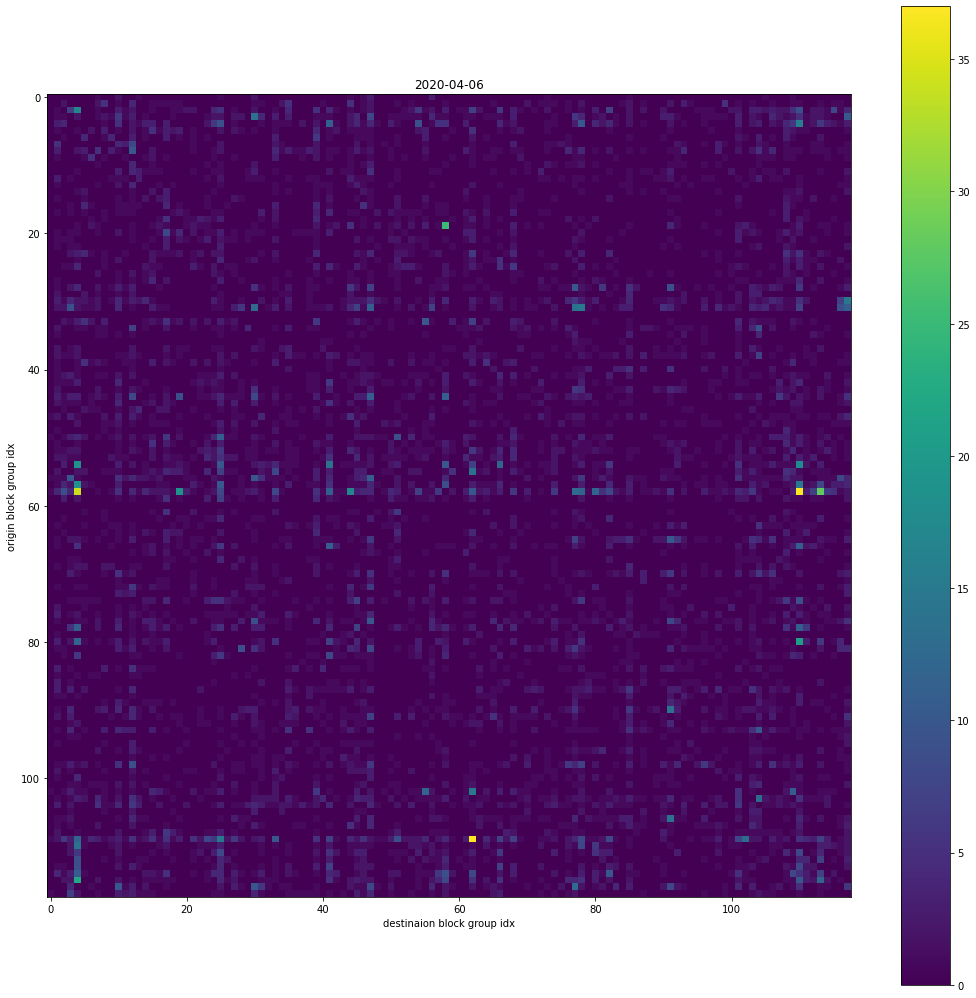

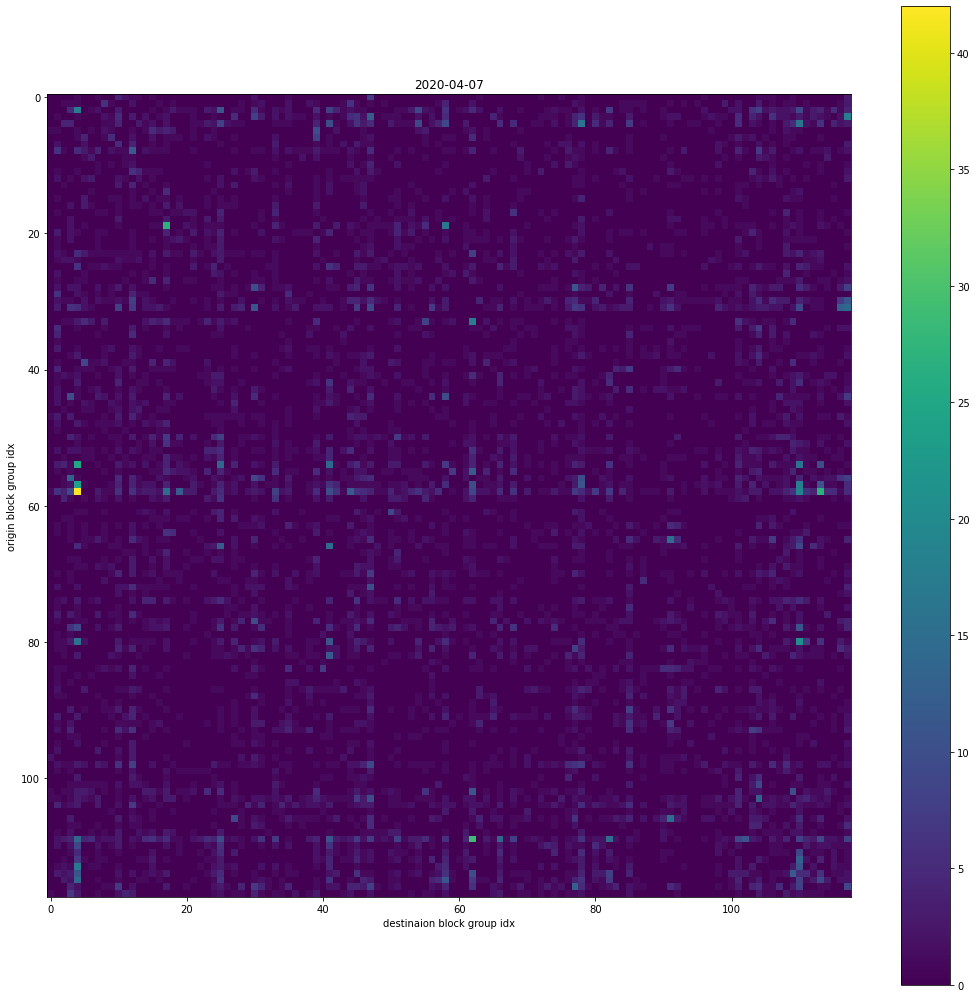

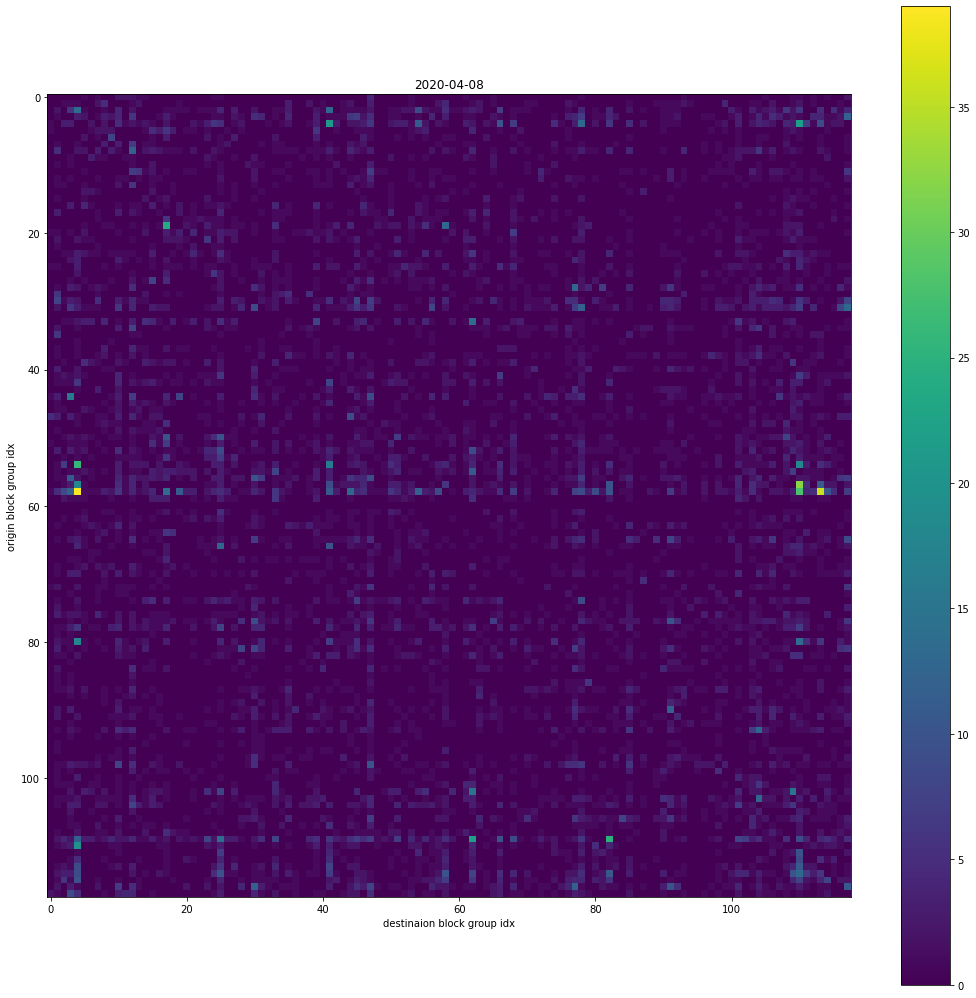

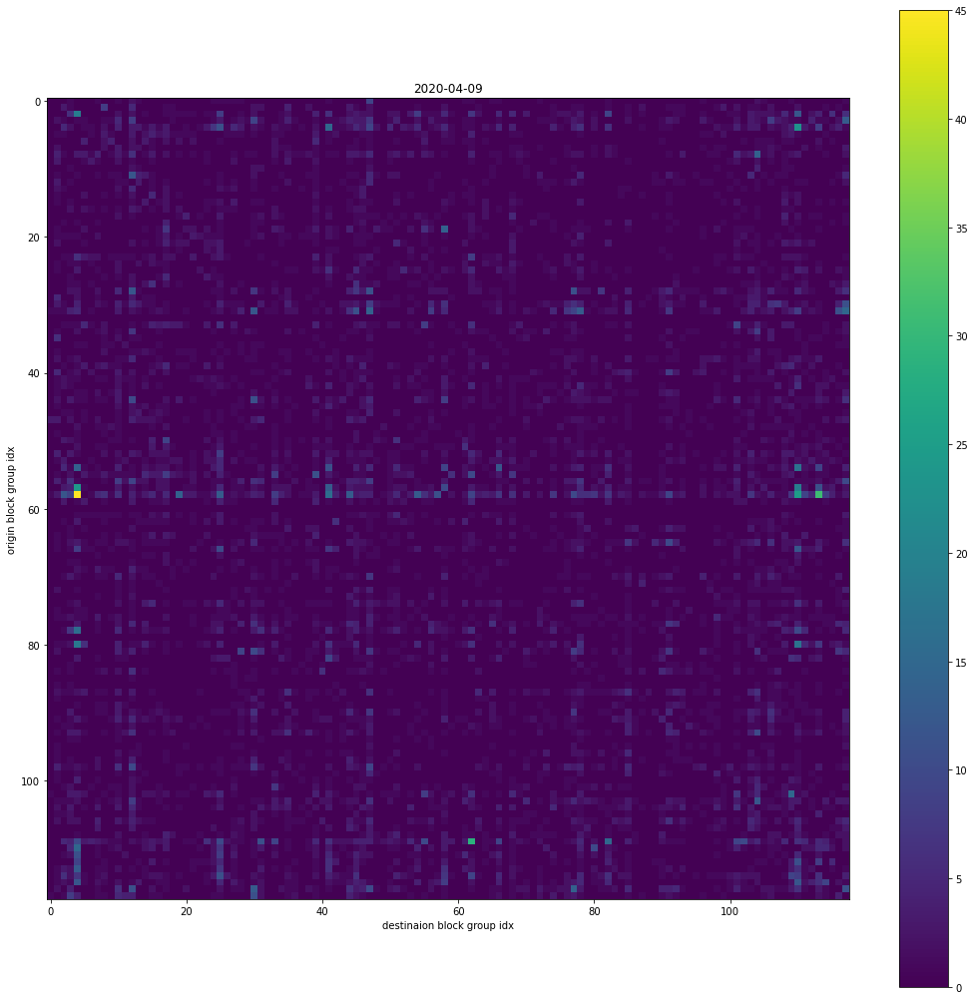

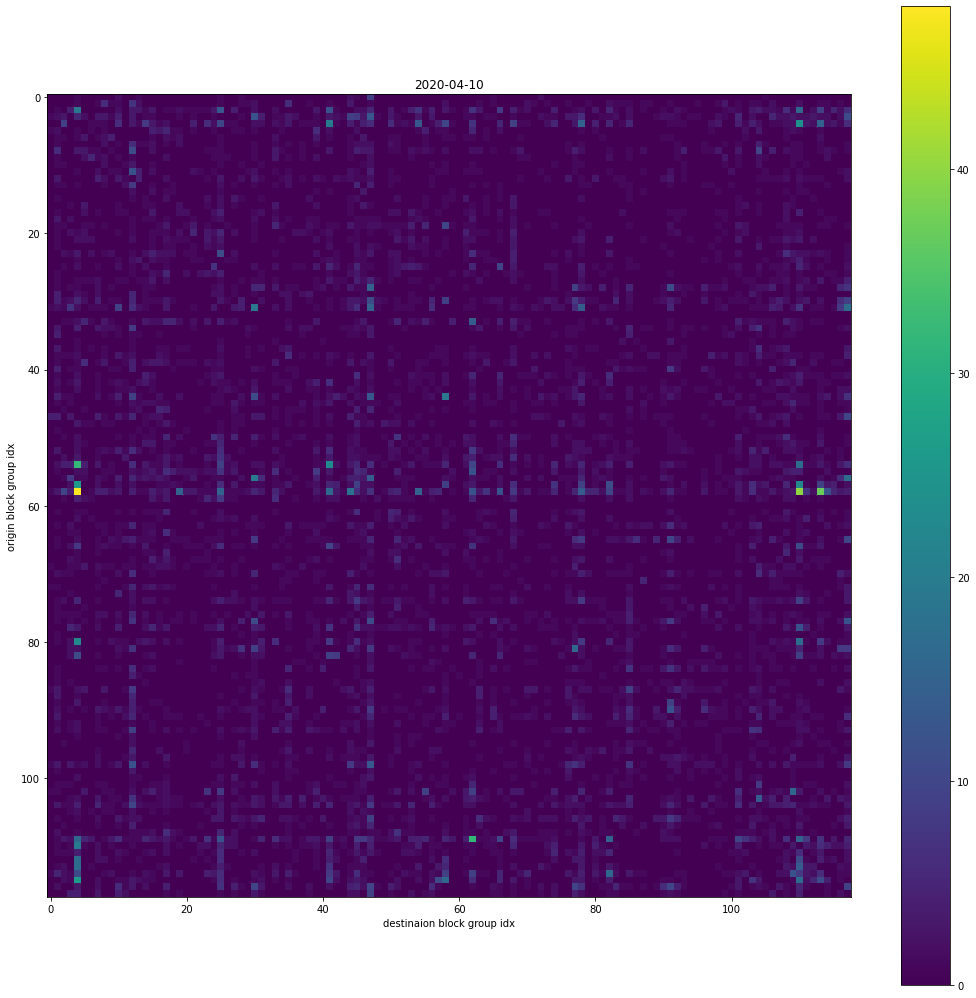

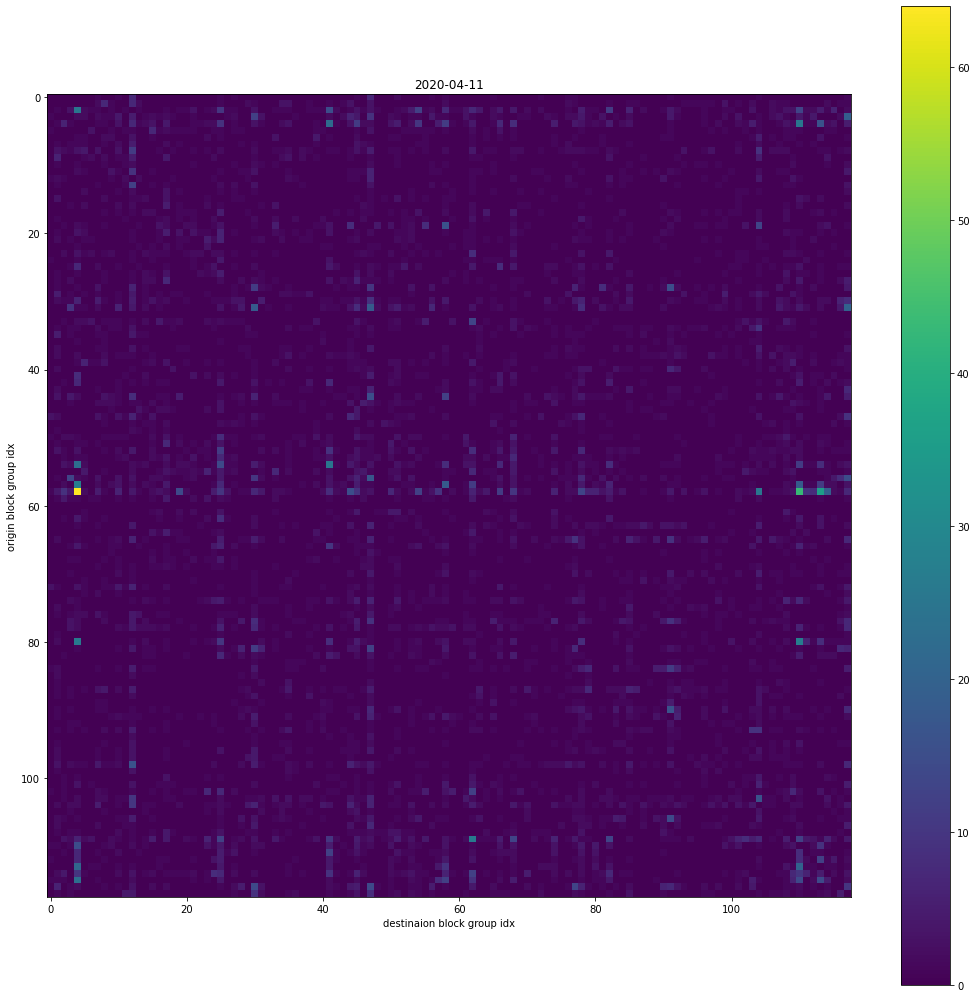

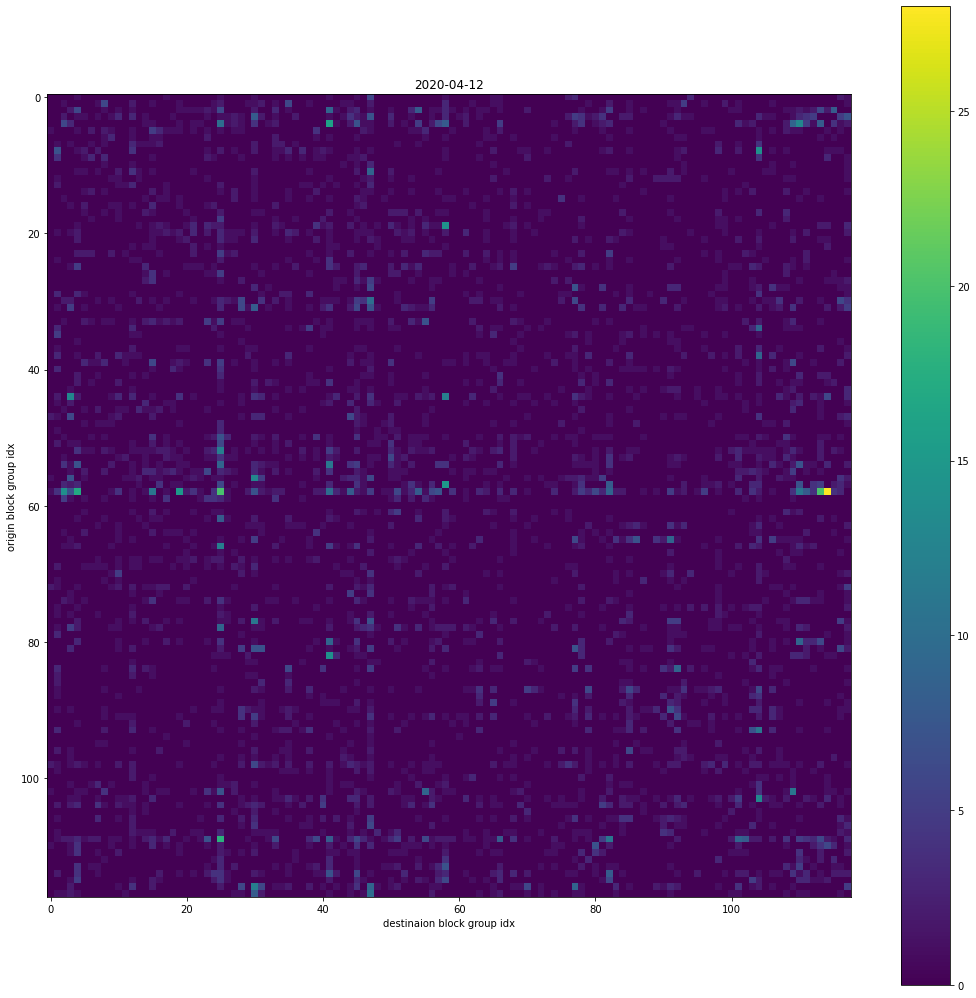

In [181]:

saved_path = r'E:\temp\SafeGraph\texas\brazos\figures'
for i in range(len(date_list)):
    fig = plt.figure(figsize=(18, 18))
    day_idx = i
    plt.title(date_list[day_idx])
    plt.xlabel("destinaion block group idx")
    plt.ylabel("origin block group idx")
    
    im = plt.imshow(mob_arr[day_idx], cmap='viridis')
    fig.colorbar(im)
    new_name = os.path.join(saved_path, date_list[day_idx] + "_no_self.png")
#     new_name = os.path.join(saved_path, date_list[day_idx] + ".png")

    plt.savefig(new_name)
    

In [180]:
#clean diagonal line

for i in range(mob_arr.shape[0]):
    print(i)
    np.fill_diagonal(mob_arr[i, :, :], 0)

0
1
2
3
4
5
6


In [182]:
out_county

array([4317, 4368, 4636, 4830, 5842, 5822, 5330])

In [75]:
df_filtered[:]['count'].sum()

368994

## generate movements

In [98]:
import geopandas as gpd
from shapely import *

Get the points of block groups

In [122]:
bg_pts = r'E:\temp\SafeGraph\USA_Block_Groups\USA_Block_Groups_pts.shp'
gdf = gpd.read_file(bg_pts)


In [82]:
gdf_short = gdf[["FIPS", "POINT_X", "POINT_Y"]]

In [84]:
gdf.dtypes

OBJECTID_1       int64
ObjectID         int64
STATE_FIPS      object
CNTY_FIPS       object
STCOFIPS        object
TRACT           object
BLKGRP          object
FIPS            object
POP2010          int64
POP10_SQMI     float64
POP2012          int64
POP12_SQMI     float64
WHITE            int64
BLACK            int64
AMERI_ES         int64
ASIAN            int64
HAWN_PI          int64
HISPANIC         int64
OTHER            int64
MULT_RACE        int64
MALES            int64
FEMALES          int64
AGE_UNDER5       int64
AGE_5_9          int64
AGE_10_14        int64
AGE_15_19        int64
AGE_20_24        int64
AGE_25_34        int64
AGE_35_44        int64
AGE_45_54        int64
AGE_55_64        int64
AGE_65_74        int64
AGE_75_84        int64
AGE_85_UP        int64
MED_AGE        float64
MED_AGE_M      float64
MED_AGE_F      float64
HOUSEHOLDS       int64
AVE_HH_SZ      float64
HSEHLD_1_M       int64
HSEHLD_1_F       int64
MARHH_CHD        int64
MARHH_NO_C       int64
MHH_CHILD  

In [121]:
gdf_short.dtypes

FIPS        object
POINT_X    float64
POINT_Y    float64
dtype: object

In [113]:
df_filtered['origin'] = df_filtered['origin'].astype(str)
df_filtered['destination'] = df_filtered['destination'].astype(str)

D:\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
D:\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [114]:
df_filtered.dtypes

date           object
origin         object
destination    object
count           int64
dtype: object

In [118]:
mergered = pd.merge(df_filtered, gdf_short, left_on="origin", right_on="FIPS")
mergered = mergered.rename(columns={"POINT_X": "origin_x", "POINT_Y": "origin_y", "FIPS": "FIPS_origin"})

mergered = pd.merge(mergered, gdf_short, left_on="destination", right_on="FIPS")
mergered = mergered.rename(columns={"POINT_X": "destination_x", "POINT_Y": "destination_y", "FIPS": "FIPS_destination"})

mergered

,date,origin,destination,count,FIPS_origin,origin_x,origin_y,FIPS_destination,destination_x,destination_y
0,2019-04-01,480410019003,480410009001,1,480410019003,-96.324041,30.648033,480410009001,-96.363174,30.643356
1,2019-04-03,480410019003,480410009001,2,480410019003,-96.324041,30.648033,480410009001,-96.363174,30.643356
2,2019-04-04,480410019003,480410009001,3,480410019003,-96.324041,30.648033,480410009001,-96.363174,30.643356
3,2019-04-05,480410019003,480410009001,1,480410019003,-96.324041,30.648033,480410009001,-96.363174,30.643356
4,2019-04-06,480410019003,480410009001,2,480410019003,-96.324041,30.648033,480410009001,-96.363174,30.643356
...,...,...,...,...,...,...,...,...,...,...
86979,2019-04-07,480410020021,480679503002,1,480410020021,-96.321371,30.665971,480679503002,-94.164460,33.161566
86980,2019-04-07,480410020021,211259706004,1,480410020021,-96.321371,30.665971,211259706004,-84.082211,37.111731
86981,2019-04-07,480410020021,481339502001,1,480410020021,-96.321371,30.665971,481339502001,-98.809171,32.454681
86982,2019-04-07,480410020021,211259706001,1,480410020021,-96.321371,30.665971,211259706001,-84.101677,37.128841


In [120]:
saved_file = r'E:\temp\SafeGraph\texas\brazos\test\week_2019-04-01.shp'

from shapely.geometry import LineString
lines = []
for idx, row in mergered[:].iterrows():
#     print(row['origin_x'])
    line = LineString([(row['origin_x'], row["origin_y"]), (row["destination_x"], row["destination_y"])])
    lines.append(line) 

flow_lines = gpd.GeoDataFrame(mergered[:], geometry=lines)    
flow_lines.to_file(saved_file)

'E:\\temp\\SafeGraph\\USA_Block_Groups\\USA_Block_Groups_pts.shp'

In [49]:
gdf["POINT_X"]

0        -94.755995
1        -94.132466
2        -94.776321
3        -94.787379
4        -94.771369
            ...    
219824   -83.383714
219825   -66.131659
219826   -82.431501
219827   -78.505914
219828   -89.356356
Name: POINT_X, Length: 219829, dtype: float64

In [50]:
gdf["FIPS"]

0         481677241011
1         482450006006
2         481677243005
3         480717102003
4         481677242002
              ...     
219824    261159900000
219825    720339902010
219826    120579900000
219827    370199901000
219828    220759900000
Name: FIPS, Length: 219829, dtype: object

## plot the daily data

In [167]:
df_od['date'] = pd.to_datetime(df_od['date'], format="%Y-%m-%d")
# df_od['date'] =df_od['date'].to_datetime().date()

df_od

,date,origin,destination,count
0,2019-01-01,480410019003,80690028022,2
1,2019-01-01,480410019003,510190302021,1
2,2019-01-01,480410019003,80690028031,2
3,2019-01-01,480410019003,483959604001,1
4,2019-01-01,480410019003,483130003001,1
...,...,...,...,...
8072129,2020-10-12,480410020021,480410001022,6
8072130,2020-10-12,480410020021,480410017012,1
8072131,2020-10-12,480410020021,483396939003,1
8072132,2020-10-12,480410020021,480519703002,1


In [168]:
origin_list = df_od['origin'].unique()
origin_list

array([480410019003, 480410009001, 480410020072, 480410020022,
       480410020081, 480410014002, 480410014003, 480410010001,
       480410010003, 480410010002, 480410011001, 480410011002,
       480410011003, 480410011004, 480410013034, 480410013031,
       480410014001, 480410016011, 480410016012, 480410016061,
       480410016051, 480410016052, 480410016042, 480410016043,
       480410017021, 480410018011, 480410017022, 480410013022,
       480410001014, 480410002012, 480410001013, 480410001021,
       480410020121, 480410002011, 480410009002, 480410005001,
       480410002013, 480410006041, 480410020151, 480410005003,
       480410018041, 480410018032, 480410004002, 480410019001,
       480410013011, 480410013012, 480410019004, 480410013021,
       480410013023, 480410017013, 480410017012, 480410018031,
       480410016041, 480410020071, 480410020123, 480410001022,
       480410020112, 480410020082, 480410020122, 480410017011,
       480410018033, 480410006034, 480410016013, 480410

D:\Anaconda3\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys
D:\Anaconda3\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys
D:\Anaconda3\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

D:\Anaconda3\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys
D:\Anaconda3\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys
D:\Anaconda3\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

D:\Anaconda3\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys
D:\Anaconda3\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys
D:\Anaconda3\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

D:\Anaconda3\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys
D:\Anaconda3\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys
D:\Anaconda3\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

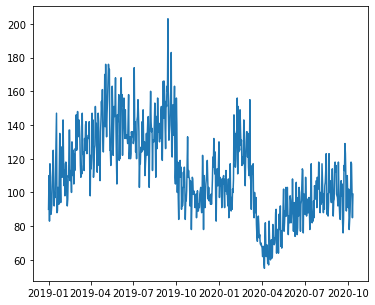

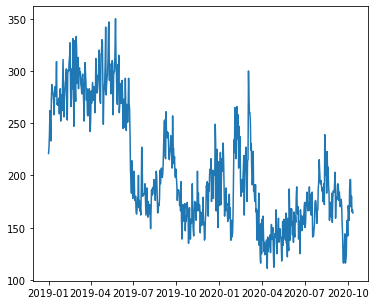

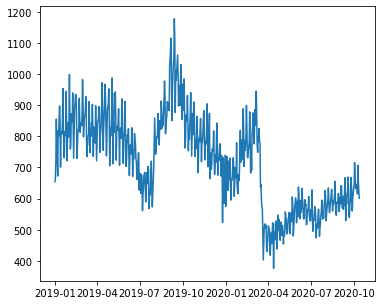

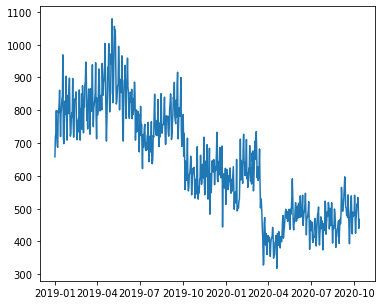

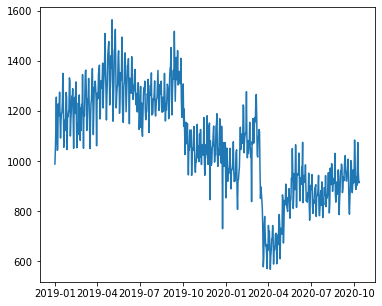

...

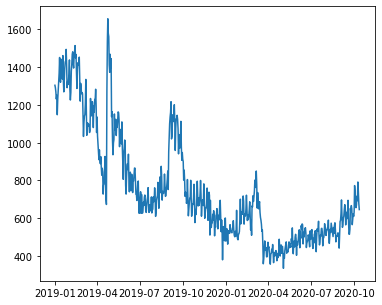

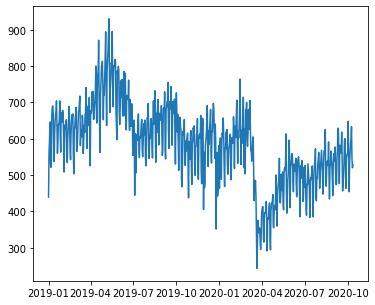

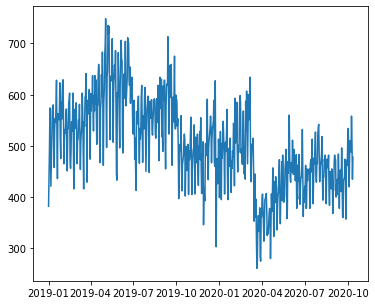

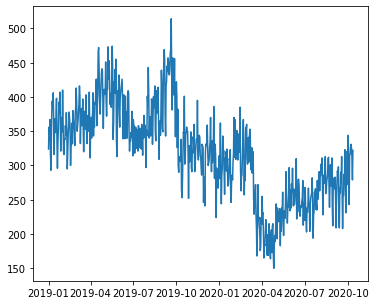

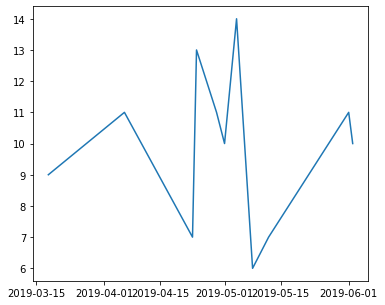

In [181]:

for idx, o in enumerate(origin_list):
    df_o = df_od[df_od['origin'] == o]
    df_o = df_o.sort_values("date")
    
    
    days = df_o["date"]
    f = plt.figure(figsize= (6, 6*118))
    ax = plt.subplot(len(origin_list), 1, idx + 1)
#     ax.title = "Block group ID: " + str(o)
    
    g = df_o.groupby(['date'])['count'].agg('sum') 
#     print(days)
    ax.plot(g.index, g.to_list())
#     plt.gcf().autofmt_xdate()
    
# plt.show()
    

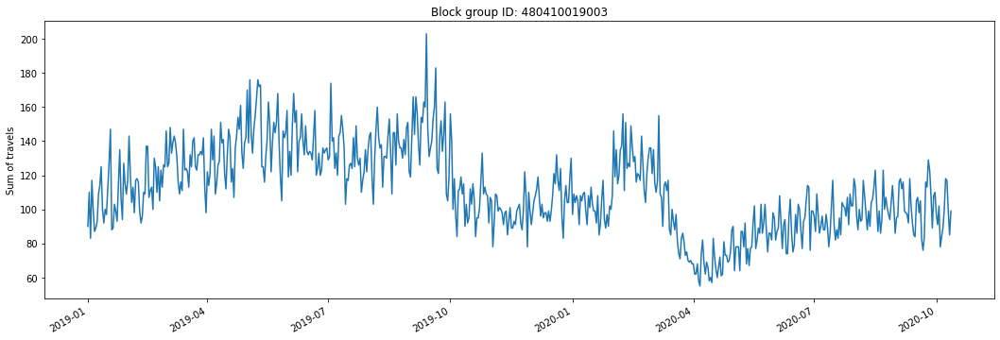

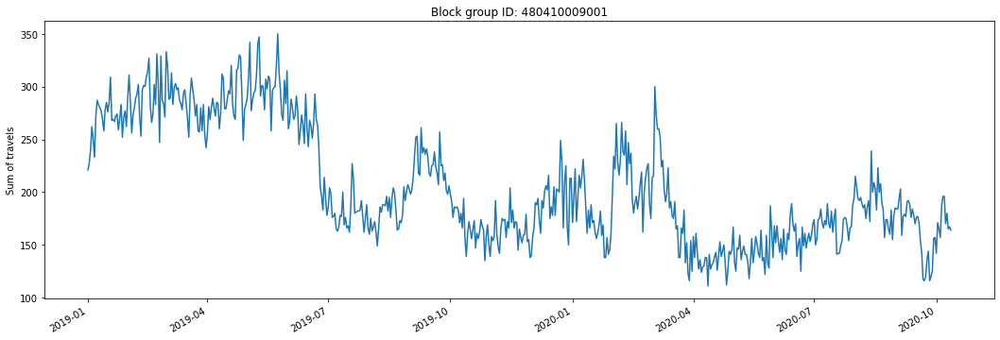

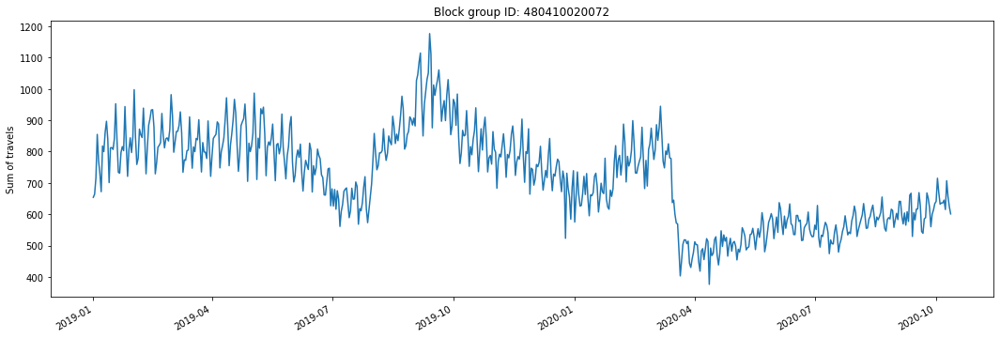

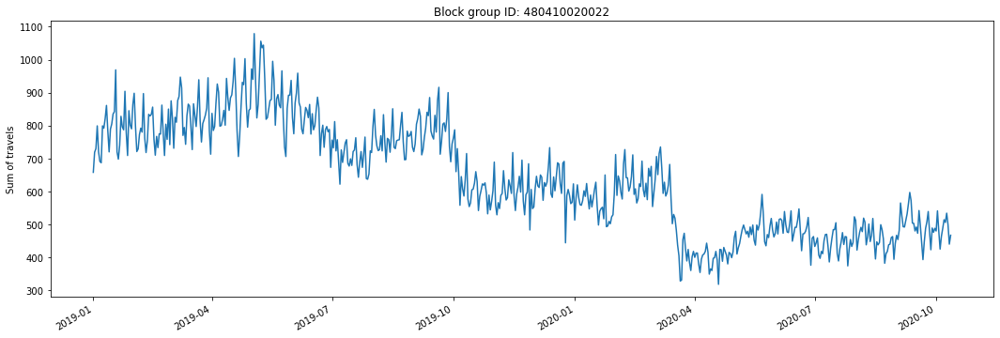

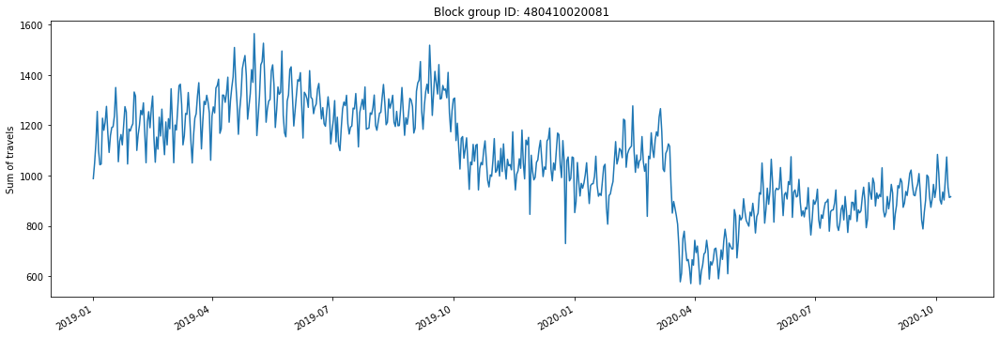

...

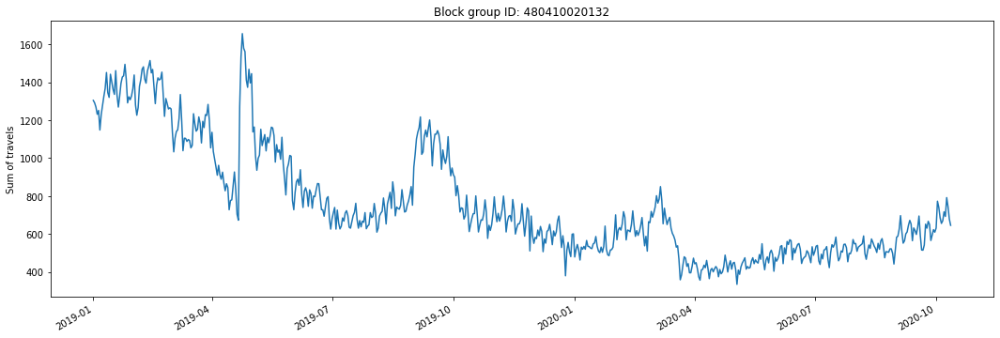

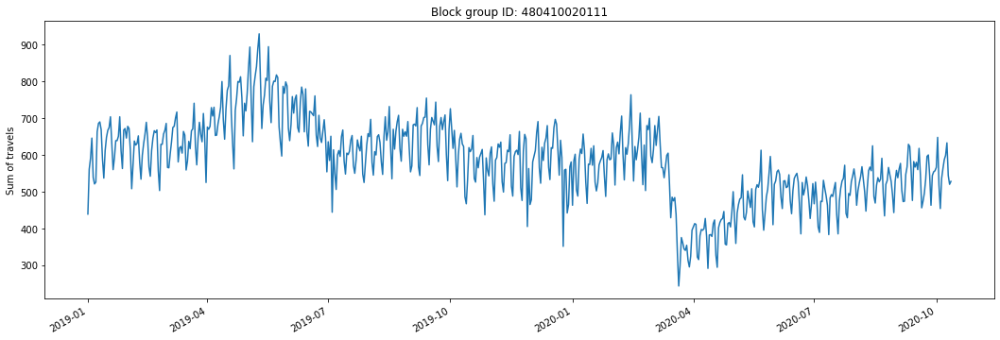

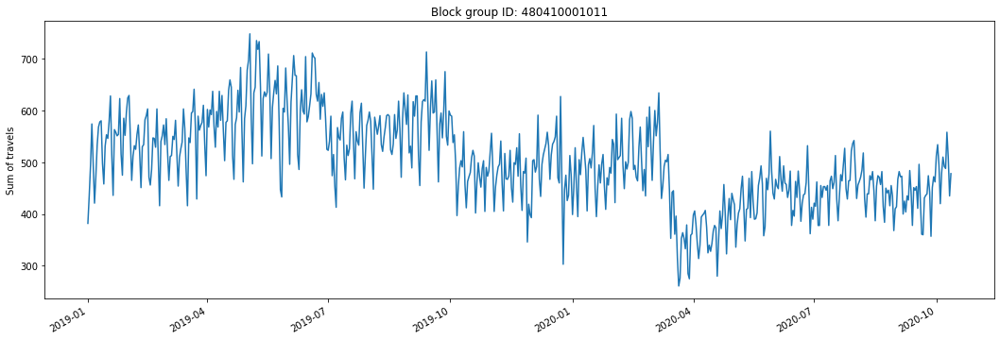

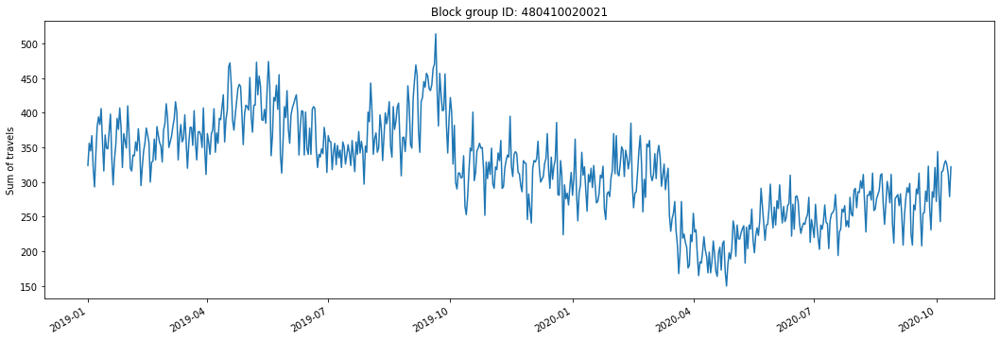

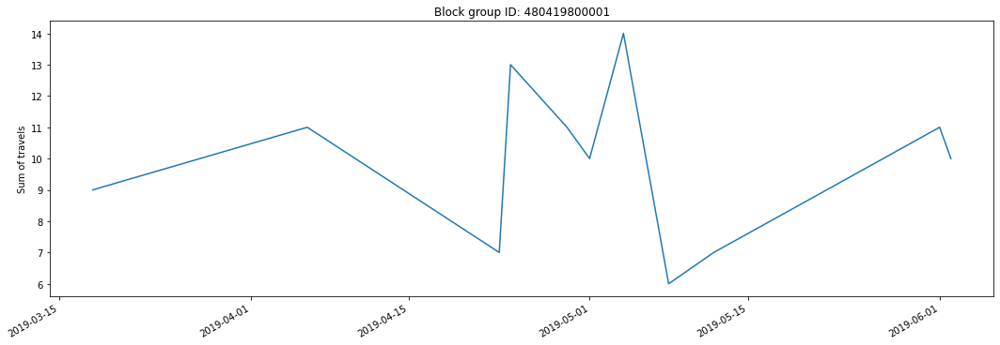

In [187]:
saved_path = r'E:\temp\SafeGraph\texas\brazos\mobility_out_of_blockgroup'

for idx, o in enumerate(origin_list):
    df_o = df_od[df_od['origin'] == o]
    df_o = df_o.sort_values("date")
    
    
    days = df_o["date"]
    f = plt.figure(figsize= (18, 6))
    
    plt.title("Block group ID: " + str(o))
    
    g = df_o.groupby(['date'])['count'].agg('sum') 
#     print(days)
    plt.plot(g.index, g.to_list())
    plt.gcf().autofmt_xdate()
    
    plt.ylabel('Sum of travels')
    
    new_name = os.path.join(saved_path, str(o) + ".png")
    
    plt.savefig(new_name)
    
    plt.show()
    


In [156]:
df_o

,date,origin,destination,count
5741,2019-01-01,480410006041,482015521021,1
5774,2019-01-01,480410006041,480410013011,2
5775,2019-01-01,480410006041,480410020132,3
5776,2019-01-01,480410006041,480410018011,1
5777,2019-01-01,480410006041,480519701001,1
...,...,...,...,...
8064867,2020-10-12,480410006041,480410019004,2
8064866,2020-10-12,480410006041,484717901022,1
8064865,2020-10-12,480410006041,480410002014,8
8064873,2020-10-12,480410006041,480410003003,2


In [172]:
g = df_o.groupby(['date'])['count'].agg('sum') 

In [173]:
g.index

DatetimeIndex(['2019-01-01', '2019-01-02', '2019-01-03', '2019-01-04',
               '2019-01-05', '2019-01-06', '2019-01-07', '2019-01-08',
               '2019-01-09', '2019-01-10',
               ...
               '2020-10-03', '2020-10-04', '2020-10-05', '2020-10-06',
               '2020-10-07', '2020-10-08', '2020-10-09', '2020-10-10',
               '2020-10-11', '2020-10-12'],
              dtype='datetime64[ns]', name='date', length=651, freq=None)

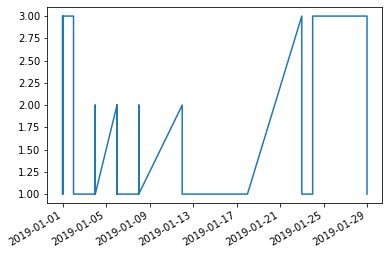

In [122]:
import matplotlib.pyplot as plt 
import matplotlib.dates as mdates


In [123]:
days

1637140   2019-01-01 00:01:00
1637141   2019-01-01 00:01:00
1637142   2019-01-01 00:01:00
1637143   2019-01-01 00:01:00
1637144   2019-01-01 00:01:00
                  ...        
1612797   2019-01-29 00:01:00
1612798   2019-01-29 00:01:00
1612799   2019-01-29 00:01:00
1612792   2019-01-29 00:01:00
1612793   2019-01-29 00:01:00
Name: date, Length: 90, dtype: datetime64[ns]

In [124]:
 df_o["origin"]

1637140    480419800001
1637141    480419800001
1637142    480419800001
1637143    480419800001
1637144    480419800001
               ...     
1612797    480419800001
1612798    480419800001
1612799    480419800001
1612792    480419800001
1612793    480419800001
Name: origin, Length: 90, dtype: int64

In [113]:
df_o

,date,origin,destination,count
1051047,2019-01-18 00:01:00,480419800001,480717102002,1
1051048,2019-01-18 00:01:00,480419800001,480410016061,1
1051049,2019-01-18 00:01:00,480419800001,480410020101,1
1051050,2019-01-18 00:01:00,480419800001,480717102005,1
1051051,2019-01-18 00:01:00,480419800001,484771706002,1
...,...,...,...,...
2135887,2019-01-02 00:01:00,480419800001,482090103042,1
2135888,2019-01-02 00:01:00,480419800001,482090104003,1
2135889,2019-01-02 00:01:00,480419800001,480219501001,1
2135890,2019-01-02 00:01:00,480419800001,484530022091,1


In [106]:
g = df_od.groupby("count").count()
g

,date,origin,destination
count,,,
1,5324495,5324495,5324495
2,1180328,1180328,1180328
3,513083,513083,513083
4,286711,286711,286711
5,178100,178100,178100
...,...,...,...
2015,1,1,1
2032,1,1,1
2097,1,1,1


In [56]:

for idx, row in joined.iterrows():
#     print(key, to_blocks[key])
#     print(row["destination_cbgs"])
    try:
        jdata = json.loads(row["destination_cbgs"])
        for key in jdata.keys():
#             pass
            fields = [row["origin_census_block_group"], int(key), jdata[key]]
            print(fields)
    except Exception as e:
        print( idx, e)

[480410019003, 480410010001, 1]
[480410019003, 480419800001, 1]
[480410019003, 480410009001, 1]
[480410019003, 480410001012, 1]
[480410019003, 480410020131, 2]
[480410019003, 480410016011, 1]
[480410019003, 480410020022, 1]
[480410019003, 482899502002, 1]
[480410019003, 480410017022, 1]
[480410019003, 480410007004, 2]
[480410019003, 482939703002, 1]
[480410019003, 484771703003, 1]
[480410019003, 480410019004, 6]
[480410019003, 483396919002, 1]
[480410019003, 482939708002, 1]
[480410019003, 482899501004, 1]
[480410019003, 480410011003, 2]
[480410019003, 480410020023, 1]
[480410019003, 480410006031, 1]
[480410019003, 483090023022, 1]
[480410019003, 482939708001, 1]
[480410019003, 481610006003, 1]
[480410019003, 480410020021, 2]
[480410019003, 480410013011, 4]
[480410019003, 484910208061, 1]
[480410019003, 480410019005, 5]
[480410019003, 480410020111, 1]
[480410019003, 480410018011, 1]
[480410019003, 480410002023, 3]
[480410019003, 480410008003, 2]
[480410019003, 480410011001, 3]
[4804100

[480410010003, 480410010001, 8]
[480410010003, 482015223022, 1]
[480410010003, 484971501024, 1]
[480410010003, 481130165183, 1]
[480410010003, 484817403002, 1]
[480410010003, 480410009001, 5]
[480410010003, 480410017011, 1]
[480410010003, 484391234002, 1]
[480410010003, 480410020082, 1]
[480410010003, 480410001012, 2]
[480410010003, 481130190271, 1]
[480410010003, 480410016062, 3]
[480410010003, 484391136271, 1]
[480410010003, 484971501021, 1]
[480410010003, 480410020102, 1]
[480410010003, 480410020131, 4]
[480410010003, 480913103004, 1]
[480410010003, 480410016011, 7]
[480410010003, 480410020022, 2]
[480410010003, 484910203171, 1]
[480410010003, 480410002021, 1]
[480410010003, 480410020142, 2]
[480410010003, 480410013031, 6]
[480410010003, 484910215052, 1]
[480410010003, 483479504004, 1]
[480410010003, 484817404002, 1]
[480410010003, 484910207032, 1]
[480410010003, 484910215031, 1]
[480410010003, 483090037082, 1]
[480410010003, 480410007004, 1]
[480410010003, 483396930003, 2]
[4804100

[480410016061, 484790018131, 1]
[480410016061, 480410002025, 25]
[480410016061, 480410020071, 1]
[480410016061, 480410016043, 10]
[480410016061, 480410003001, 1]
[480410016061, 480410016041, 2]
[480410016061, 480410018033, 2]
[480410016061, 484410115002, 1]
[480410016061, 60375705011, 1]
[480410016061, 482015416021, 1]
[480410016061, 480410019004, 1]
[480410016061, 480410016052, 4]
[480410016061, 484530017771, 1]
[480410016061, 481210215163, 1]
[480410016061, 480410002024, 2]
[480410016061, 480410020123, 24]
[480410016061, 482012105003, 1]
[480410016061, 482012205001, 4]
[480410016061, 482014534032, 2]
[480410016061, 484530017184, 1]
[480410016061, 480410013032, 2]
[480410016061, 482014234013, 2]
[480410016061, 480410011003, 5]
[480410016061, 480410020023, 3]
[480410016061, 480410020091, 2]
[480410016061, 480410020012, 1]
[480410016061, 480410001031, 1]
[480410016061, 484910215041, 1]
[480410016061, 481130164102, 1]
[480410016061, 261251650003, 1]
[480410016061, 480410002013, 1]
[48041

[480410001014, 480410020131, 1]
[480410001014, 480410016011, 3]
[480410001014, 480410020022, 3]
[480410001014, 480410002021, 1]
[480410001014, 480410017022, 4]
[480410001014, 480410020011, 3]
[480410001014, 480410007004, 9]
[480410001014, 483959603002, 1]
[480410001014, 340230087001, 1]
[480410001014, 480410007002, 2]
[480410001014, 480410002025, 1]
[480410001014, 480410003001, 2]
[480410001014, 480410002014, 2]
[480410001014, 482015214003, 1]
[480410001014, 361190128021, 1]
[480410001014, 340057029142, 1]
[480410001014, 480410019004, 12]
[480410001014, 483550033051, 1]
[480410001014, 482014528011, 1]
[480410001014, 480410008004, 3]
[480410001014, 360610103001, 1]
[480410001014, 480410002024, 6]
[480410001014, 480410020081, 2]
[480410001014, 480410003003, 4]
[480410001014, 80370007011, 1]
[480410001014, 480410005002, 2]
[480410001014, 480410013032, 3]
[480410001014, 480410006041, 1]
[480410001014, 350250010033, 1]
[480410001014, 480410011003, 4]
[480410001014, 480410020023, 7]
[4804100

[480410005001, 480410009002, 2]
[480410005001, 480410005005, 1]
[480410002013, 480410010001, 1]
[480410002013, 480519705003, 1]
[480410002013, 480410017011, 2]
[480410002013, 480410020082, 1]
[480410002013, 482015401001, 1]
[480410002013, 480410016062, 2]
[480410002013, 482013308001, 1]
[480410002013, 480410020102, 1]
[480410002013, 480410016011, 2]
[480410002013, 480410002021, 2]
[480410002013, 480410013031, 1]
[480410002013, 480410001021, 1]
[480410002013, 480410002025, 2]
[480410002013, 480410018033, 1]
[480410002013, 480410002014, 4]
[480410002013, 480410019004, 1]
[480410002013, 482014316003, 1]
[480410002013, 481210203101, 1]
[480410002013, 480410008004, 1]
[480410002013, 480410020081, 1]
[480410002013, 480410003003, 1]
[480410002013, 482015545012, 1]
[480410002013, 60290031151, 1]
[480410002013, 480410011003, 6]
[480410002013, 480410020023, 1]
[480410002013, 480410020091, 1]
[480410002013, 480410002013, 49]
[480410002013, 480410013022, 1]
[480410002013, 480410020021, 2]
[4804100

[480410013011, 480410002024, 1]
[480410013011, 480410020081, 3]
[480410013011, 480410003003, 2]
[480410013011, 480410013032, 6]
[480410013011, 480410006041, 1]
[480410013011, 480410020101, 1]
[480410013011, 480410011003, 2]
[480410013011, 480410020023, 3]
[480410013011, 480410020091, 3]
[480410013011, 480410006031, 4]
[480410013011, 484910201103, 1]
[480410013011, 484717903001, 1]
[480410013011, 480410013022, 4]
[480410013011, 480410020021, 5]
[480410013011, 482015548021, 1]
[480410013011, 480410013011, 92]
[480410013011, 480410020132, 3]
[480410013011, 480410020151, 9]
[480410013011, 480410018011, 1]
[480410013011, 480410008003, 1]
[480410013011, 481210219002, 1]
[480410013011, 480410011001, 1]
[480410013011, 480410010003, 1]
[480410013011, 480410020122, 2]
[480410013011, 481851803014, 1]
[480410013011, 480410017013, 2]
[480410013011, 480410017021, 1]
[480410013011, 484771701003, 1]
[480410013011, 480410014001, 1]
[480410013011, 484717905003, 1]
[480410013011, 480410016013, 1]
[480410

[480410020123, 480410009001, 4]
[480410020123, 480410016061, 9]
[480410020123, 480410018012, 1]
[480410020123, 480410017011, 7]
[480410020123, 482015544011, 2]
[480410020123, 480410020082, 9]
[480410020123, 480157601001, 1]
[480410020123, 482090109013, 1]
[480410020123, 480410016051, 1]
[480410020123, 480410016062, 10]
[480410020123, 480050001021, 1]
[480410020123, 160050008001, 1]
[480410020123, 170318034004, 1]
[480410020123, 482015549021, 1]
[480410020123, 480410020102, 1]
[480410020123, 480410020131, 18]
[480410020123, 480410016011, 16]
[480410020123, 480410020022, 4]
[480410020123, 482014103002, 1]
[480410020123, 481851802003, 1]
[480410020123, 482015429003, 1]
[480410020123, 484530017652, 1]
[480410020123, 483030106002, 1]
[480410020123, 480410017022, 2]
[480410020123, 480410014003, 7]
[480410020123, 480291215081, 1]
[480410020123, 480410020142, 3]
[480410020123, 480410013031, 7]
[480410020123, 484230014042, 1]
[480410020123, 480410007004, 3]
[480410020123, 482015514003, 1]
[4804

[480410017011, 480410014003, 1]
[480410017011, 480410020142, 1]
[480410017011, 482450026002, 1]
[480410017011, 480410004002, 1]
[480410017011, 480410013031, 4]
[480410017011, 483970404011, 1]
[480410017011, 480410002025, 3]
[480410017011, 480410016043, 1]
[480410017011, 480410016041, 1]
[480410017011, 480410018033, 3]
[480410017011, 480410019004, 1]
[480410017011, 480410020123, 4]
[480410017011, 481810001011, 1]
[480410017011, 482013103003, 1]
[480410017011, 480519702004, 1]
[480410017011, 480410020081, 4]
[480410017011, 482450111013, 1]
[480410017011, 484717907002, 1]
[480410017011, 480410013032, 2]
[480410017011, 480410011003, 1]
[480410017011, 480850313092, 1]
[480410017011, 480410020023, 1]
[480410017011, 480850313081, 1]
[480410017011, 400850942002, 1]
[480410017011, 481810009011, 1]
[480410017011, 482015557021, 2]
[480410017011, 484717903001, 3]
[480410017011, 484736806002, 1]
[480410017011, 480410018032, 1]
[480410017011, 480410013011, 1]
[480410017011, 482450070021, 1]
[4804100

[480410020011, 480410020023, 6]
[480410020011, 480410020091, 1]
[480410020011, 480410020012, 2]
[480410020011, 482013131002, 1]
[480410020011, 483396937001, 1]
[480410020011, 483550054081, 1]
[480410020011, 480410006031, 4]
[480410020011, 483970405032, 1]
[480410020011, 483970405041, 1]
[480410020011, 480410013022, 4]
[480410020011, 480410020021, 3]
[480410020011, 480410013011, 5]
[480410020011, 481677207003, 1]
[480410020011, 480410019005, 3]
[480410020011, 480410020132, 1]
[480410020011, 482870002003, 1]
[480410020011, 480410020111, 2]
[480410020011, 480410003004, 1]
[480410020011, 480410020151, 5]
[480410020011, 480410018011, 10]
[480410020011, 480519701001, 1]
[480410020011, 481239701002, 1]
[480410020011, 481851801022, 1]
[480410020011, 290950080003, 1]
[480410020011, 482015112003, 1]
[480410020011, 480410011001, 3]
[480410020011, 480410010003, 1]
[480410020011, 481851801012, 1]
[480410020011, 560250018001, 1]
[480410020011, 480410017013, 9]
[480410020011, 480410020092, 1]
[480410

[480410005004, 480410004002, 3]
[480410005004, 480410013031, 3]
[480410005004, 480410007004, 1]
[480410005004, 480410002025, 1]
[480410005004, 480519703003, 1]
[480410005004, 484530023084, 1]
[480410005004, 480410019004, 4]
[480410005004, 484790017101, 1]
[480410005004, 480410020112, 1]
[480410005004, 484790017202, 1]
[480410005004, 481130099002, 1]
[480410005004, 484391132181, 1]
[480410005004, 480410020141, 1]
[480410005004, 480410005002, 1]
[480410005004, 480410011003, 1]
[480410005004, 481851803011, 1]
[480410005004, 480410006031, 2]
[480410005004, 480410004001, 3]
[480410005004, 480410006032, 1]
[480410005004, 480410013011, 1]
[480410005004, 480410003004, 9]
[480410005004, 480410020151, 1]
[480410005004, 480410005003, 1]
[480410005004, 480410011001, 3]
[480410005004, 480410010003, 1]
[480410005004, 481851803014, 1]
[480410005004, 480410017013, 2]
[480410005004, 480410017021, 1]
[480410005004, 484072003003, 1]
[480410005004, 482839503001, 1]
[480410005004, 480410004004, 1]
[4804100

[480410008003, 480410013034, 2]
[480410008003, 480410002022, 7]
[480410008003, 480410013012, 2]
[480410008003, 484530018583, 1]
[480410008003, 480410019002, 3]
[480410008003, 483396936002, 1]
[480410008003, 480410001013, 8]
[480410008003, 482015549031, 1]
[480410008003, 480410008002, 7]
[480410008003, 480410020061, 1]
[480410008003, 482012517002, 1]
[480410008003, 480410002011, 1]
[480410008003, 481851802002, 1]
[480410008003, 480410019001, 4]
[480410008003, 480410010004, 1]
[480410008003, 484530018601, 1]
[480410008003, 480410014002, 2]
[480410008003, 480410009002, 5]
[480410008003, 480410016012, 1]
[480410008003, 480410006043, 2]
[480410008003, 480410017012, 4]
[480410008003, 483959605003, 1]
[480410008004, 480410010001, 1]
[480410008004, 480410003002, 2]
[480410008004, 480410009001, 3]
[480410008004, 480410018012, 2]
[480410008004, 480410017011, 1]
[480410008004, 480410020082, 1]
[480410008004, 480410020022, 2]
[480410008004, 480410013031, 2]
[480410008004, 480410007004, 1]
[4804100

[480410002024, 480410014002, 2]
[480410002024, 480410009002, 2]
[480410002024, 480410001022, 2]
[480410002024, 480410006043, 2]
[480410002024, 480410017012, 1]
[480410002024, 483959605003, 4]
[480410002024, 480410001014, 2]
[480410002024, 480939503003, 2]
[480410004004, 480410010001, 2]
[480410004004, 480410009001, 2]
[480410004004, 480410017011, 1]
[480410004004, 480410020082, 1]
[480410004004, 480410001012, 2]
[480410004004, 480410016051, 1]
[480410004004, 483130004002, 1]
[480410004004, 482899501003, 1]
[480410004004, 480410016011, 1]
[480410004004, 480410020022, 1]
[480410004004, 480410004002, 3]
[480410004004, 480410001021, 1]
[480410004004, 480410002025, 1]
[480410004004, 480519702002, 1]
[480410004004, 480410002014, 1]
[480410004004, 481677245001, 1]
[480410004004, 480410019004, 6]
[480410004004, 480410008004, 1]
[480410004004, 480410002024, 1]
[480410004004, 483130002001, 1]
[480410004004, 482899501004, 1]
[480410004004, 480410003003, 1]
[480410004004, 482015544021, 1]
[4804100

[480410020102, 480410017013, 3]
[480410020102, 480410020092, 3]
[480410020102, 480410017021, 2]
[480410020102, 480050004002, 1]
[480410020102, 480570005002, 2]
[480410020102, 484910209004, 1]
[480410020102, 481851802001, 1]
[480410020102, 480410014001, 1]
[480410020102, 130639800001, 1]
[480410020102, 481851802005, 1]
[480410020102, 480050010011, 1]
[480410020102, 483090025031, 1]
[480410020102, 480410016013, 2]
[480410020102, 481851803013, 1]
[480410020102, 483396946001, 1]
[480410020102, 484391042013, 2]
[480410020102, 482015417003, 3]
[480410020102, 480410013034, 3]
[480410020102, 482019801001, 1]
[480410020102, 480410002022, 2]
[480410020102, 480410013012, 1]
[480410020102, 480410008001, 1]
[480410020102, 480570005004, 2]
[480410020102, 483732104002, 1]
[480410020102, 480050007003, 1]
[480410020102, 480410008002, 1]
[480410020102, 482015554021, 1]
[480410020102, 483319505001, 1]
[480410020102, 480410020061, 2]
[480410020102, 40050016003, 1]
[480410020102, 480913108013, 1]
[48041002